# NATURAL LANGUAGE PROCESSING - CHATBOT INTERFACE

### Package Version:
- tensorflow==2.2.0
- pandas==1.0.5
- numpy==1.18.5
- google==2.0.3

# CHATBOT Interface

## Project Objective
### Design a ML/DL based chatbot utility which can help the professionals to highlight the safety risk as per the incident description

## Dataset

#### Context
The database comes from one of the biggest industry in Brazil and in the world. It is an urgent need for industries/companies around the
globe to understand why employees still suffer some injuries/accidents in plants. Sometimes they also die in such environment.

**Required Files given in below link.**

 https://www.kaggle.com/ihmstefanini/industrial-safety-and-health-analytics-database

## Data Description
The database is basically records of accidents from 12 different plants in 03 different countries which every line in the data is an
occurrence of an accident.

Columns description: 

- Data: timestamp or time/date information

- Countries: which country the accident occurred (anonymised)

- Local: the city where the manufacturing plant is located (anonymised)

- Industry sector: which sector the plant belongs to
- Accident level: from I to VI, it registers how severe was the accident (I means not severe but VI means very severe)
- Potential Accident Level: Depending on the Accident Level, the database also registers how severe the accident could have been (due to other factors
involved in the accident)
- Genre: if the person is male of female
- Employee or Third Party: if the injured person is an employee or a third party
- Critical Risk: some description of the risk involved in the accident
- Description: Detailed description of how the accident happened.


In [ ]:
import tensorflow as tf
tf.__version__

'2.4.1'

In [ ]:
# Initialize the random number generator
import random
random.seed(0)

# Ignore the warnings
import warnings
warnings.filterwarnings("ignore")

In [ ]:
import glob

# import numpy, pandas and other general libraries
import numpy as np
import pandas as pd
import re
import os

# plot the chart
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# encoding
from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.preprocessing.text import Tokenizer

# to split Train and Test data
from sklearn.model_selection import train_test_split

# To pad sentence #
from keras.preprocessing import sequence
from keras.preprocessing.sequence import pad_sequences

# Define the model
from keras.models import Sequential
from keras.layers import Embedding
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Conv1D, MaxPooling1D
from keras.layers import Activation
from keras.layers import BatchNormalization
from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers import TimeDistributed
from keras.layers import Bidirectional

from keras import regularizers, optimizers

# import optimizer
from tensorflow.keras.optimizers import Adam

# Transformer
from tensorflow.keras import layers
from tensorflow import keras

# for backup
import copy

# Milestone 1

## Step1 : Import the Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


Mount the google drive and map to Colab

In [ ]:
#### Set the working directory path where the dataset is stored in Google drive ####
project_path = '/content/drive/My Drive/AIML/Data/capstone/'

Define the project path by specifying the location of the dataset in the google drive

### Load the csv file - Industry safety dataset

In [ ]:
safety_data = pd.read_csv(project_path + "industrial_safety_and_health_database_with_accidents_description.csv")

Read the csv file using pandas read_csv and store the data in safety_data dataframe

In [ ]:
print(safety_data.shape)

(425, 11)


Safety dataset contains 425 records and 11 attributes

In [ ]:
safety_data.head()

,Unnamed: 0,Data,Countries,Local,Industry Sector,Accident Level,Potential Accident Level,Genre,Employee or Third Party,Critical Risk,Description
0,0,2016-01-01 00:00:00,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...
1,1,2016-01-02 00:00:00,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...
2,2,2016-01-06 00:00:00,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...
3,3,2016-01-08 00:00:00,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,4,2016-01-10 00:00:00,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...


Display first 5 records from the loaded file. It has 11 columns namely, Date (timestamp), countries, Local, Industry Sector, Accident Level, Potential Accident Level, Gender, Employee or 3rd party details, Critical risk and description of accident

In [ ]:
safety_data.columns

Index(['Unnamed: 0', 'Data', 'Countries', 'Local', 'Industry Sector',
       'Accident Level', 'Potential Accident Level', 'Genre',
       'Employee or Third Party', 'Critical Risk', 'Description'],
      dtype='object')

## Step 2 : Data Cleansing

### Correct the Features names

Some of the column names are meaningless. Hence, correct the column names and add column names, if not exists

In [ ]:
safety_data.columns =['index', 'Date', 'Country', 'Local', 'Industry Sector', 'Accident Level', 'Potential Accident Level', 'Gender', 'Employee Type', 'Critical Risk', 'Description'] 

In [ ]:
safety_data.columns

Index(['index', 'Date', 'Country', 'Local', 'Industry Sector',
       'Accident Level', 'Potential Accident Level', 'Gender', 'Employee Type',
       'Critical Risk', 'Description'],
      dtype='object')

In [ ]:
safety_data.head()

,index,Date,Country,Local,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description
0,0,2016-01-01 00:00:00,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...
1,1,2016-01-02 00:00:00,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...
2,2,2016-01-06 00:00:00,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...
3,3,2016-01-08 00:00:00,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,4,2016-01-10 00:00:00,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...


### Drop Unnamed Index feature

In [ ]:
#safety_data = safety_data.drop(columns=['index', 'Date'], axis=1)
safety_data = safety_data.drop(columns=['index'], axis=1)

In [ ]:
safety_data.columns

Index(['Date', 'Country', 'Local', 'Industry Sector', 'Accident Level',
       'Potential Accident Level', 'Gender', 'Employee Type', 'Critical Risk',
       'Description'],
      dtype='object')

In [ ]:
safety_data.head()

,Date,Country,Local,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description
0,2016-01-01 00:00:00,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...
1,2016-01-02 00:00:00,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...
2,2016-01-06 00:00:00,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...
3,2016-01-08 00:00:00,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,2016-01-10 00:00:00,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...


Column 'Index' dropped from the dataset. 

#### Check for duplication of data 

In [ ]:
# Check if duplicate data exits

duplicates = safety_data.duplicated()
print('Number of duplicate rows = %d' % (duplicates.sum()))

Number of duplicate rows = 7


In [ ]:
safety_data = safety_data.drop_duplicates()

In [ ]:
print(safety_data.shape)

(418, 10)


7 records are duplicated and removed. Now the shape of the dataset is 418 rows and 10 features. these are unique rows

## Step 3 : Data Pre-processing

We need to pre-process/make the data ready before training the dataset

### Get length of each description and add a column for that

In [ ]:
safety_data["Description_length"]= safety_data["Description"].str.len() 

Added a column called "Description_length" and it stores the length of the Descption details. This helps us to decided the minimum and maximum words for text processing

### Understand the length of Accident Description

In [ ]:
safety_data['Description_length'].describe()

count     418.000000
mean      365.413876
std       177.686933
min        94.000000
25%       225.500000
50%       334.000000
75%       453.000000
max      1029.000000
Name: Description_length, dtype: float64

Average length of accident or incident description is 365 characters. Minimum lenght is 94 characters and max length is 1029 characters

In [ ]:
safety_data.head()

,Date,Country,Local,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description,Description_length
0,2016-01-01 00:00:00,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...,457
1,2016-01-02 00:00:00,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...,307
2,2016-01-06 00:00:00,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...,314
3,2016-01-08 00:00:00,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...,562
4,2016-01-10 00:00:00,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...,487


In [ ]:
maximum = max(safety_data["Description"].str.split().apply(len))
maximum

183

In [ ]:
len(safety_data['Description'][183].split())

25

There are maximum of 183 words in the "Description". And, 25 records have maximum number of words ie. 183 words.

### Date formatting

#### Convert to Data format

In [ ]:
safety_data['Date'] = pd.to_datetime(safety_data['Date'])

In [ ]:
print("Latest Incident Date as per dataset : ", safety_data.Date.max())
print("Oldest Incident Date as per dataset : ", safety_data.Date.min())

Latest Incident Date as per dataset :  2017-07-09 00:00:00
Oldest Incident Date as per dataset :  2016-01-01 00:00:00


The incident records are from 1st Jan 2016 to 9th July 2017

#### Extract Year, Month, Weekday and WeekofYear

In [ ]:
safety_data['Year'] = safety_data['Date'].apply(lambda d : d.year)
safety_data['Month'] = safety_data['Date'].apply(lambda d : d.month)
safety_data['Weekday'] = safety_data['Date'].apply(lambda d : d.day_name())
safety_data['WeekofYear'] = safety_data['Date'].apply(lambda d : d.weekofyear)

In [ ]:
safety_data.columns

Index(['Date', 'Country', 'Local', 'Industry Sector', 'Accident Level',
       'Potential Accident Level', 'Gender', 'Employee Type', 'Critical Risk',
       'Description', 'Description_length', 'Year', 'Month', 'Weekday',
       'WeekofYear'],
      dtype='object')

In [ ]:
safety_data.head()

,Date,Country,Local,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description,Description_length,Year,Month,Weekday,WeekofYear
0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...,457,2016,1,Friday,53
1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...,307,2016,1,Saturday,53
2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...,314,2016,1,Wednesday,1
3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...,562,2016,1,Friday,1
4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...,487,2016,1,Sunday,1


In [ ]:
safety_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      418 non-null    datetime64[ns]
 1   Country                   418 non-null    object        
 2   Local                     418 non-null    object        
 3   Industry Sector           418 non-null    object        
 4   Accident Level            418 non-null    object        
 5   Potential Accident Level  418 non-null    object        
 6   Gender                    418 non-null    object        
 7   Employee Type             418 non-null    object        
 8   Critical Risk             418 non-null    object        
 9   Description               418 non-null    object        
 10  Description_length        418 non-null    int64         
 11  Year                      418 non-null    int64         
 12  Month                 

Date attributes extracted from date like 'Year, Month, Weekday and Week of the Year' are added as columns in the safety dataset

#### Capture the Quarter - based on 3 countries data

1.   AMJ-QTR1 - APRIL, MAY, JUNE
2.   JAS_QTR2 - JULY, AUGUST, SEPTEMBER
3.   OND_QTR3 - OCTOBER, NOVEMBER, DECEMBER
4.   JFM_QTR4 - JANUARY, FEBRUARY, MARCH

Here, Not using seasons as the accidents happened in 3 countries

In [ ]:
safety_data.loc[(safety_data.Month == 4) | (safety_data.Month == 5) | (safety_data.Month == 6), 'Quarter'] = 'AMJ_QTR1'
safety_data.loc[(safety_data.Month == 7) | (safety_data.Month == 8) | (safety_data.Month == 9), 'Quarter'] = 'JAS_QTR2'
safety_data.loc[(safety_data.Month == 10)| (safety_data.Month == 11)| (safety_data.Month == 12),'Quarter'] = 'OND_QTR3'
safety_data.loc[(safety_data.Month == 1) | (safety_data.Month == 2) | (safety_data.Month == 3), 'Quarter'] = 'JFM_QTR4'

In [ ]:
safety_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      418 non-null    datetime64[ns]
 1   Country                   418 non-null    object        
 2   Local                     418 non-null    object        
 3   Industry Sector           418 non-null    object        
 4   Accident Level            418 non-null    object        
 5   Potential Accident Level  418 non-null    object        
 6   Gender                    418 non-null    object        
 7   Employee Type             418 non-null    object        
 8   Critical Risk             418 non-null    object        
 9   Description               418 non-null    object        
 10  Description_length        418 non-null    int64         
 11  Year                      418 non-null    int64         
 12  Month                 

New feature "Quarter" is included to the dataset. This helps in identifying quarter where most of the accidents occured

In [ ]:
safety_data.head()

,Date,Country,Local,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description,Description_length,Year,Month,Weekday,WeekofYear,Quarter
0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...,457,2016,1,Friday,53,JFM_QTR4
1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...,307,2016,1,Saturday,53,JFM_QTR4
2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...,314,2016,1,Wednesday,1,JFM_QTR4
3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...,562,2016,1,Friday,1,JFM_QTR4
4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...,487,2016,1,Sunday,1,JFM_QTR4


Display first 5 rows. 



### Verify if the data contains null values and Unique values in each attributes

In [ ]:
temp_data = pd.DataFrame(safety_data.dtypes)
temp_data['Missing Values'] = safety_data.isnull().sum()
temp_data['Unique Count/Values'] = safety_data.nunique()
temp_data

,0,Missing Values,Unique Count/Values
Date,datetime64[ns],0,287
Country,object,0,3
Local,object,0,12
Industry Sector,object,0,3
Accident Level,object,0,5
Potential Accident Level,object,0,6
Gender,object,0,2
Employee Type,object,0,3
Critical Risk,object,0,33
Description,object,0,411


No null values found in the safety dataset.

This shows, the dataset has 
1. 287 unique days, 
2. 3 countries, 
3. 12 Local, 
4. 3 industry sectors, 
5. 5 accident level, 
6. 6 potential accident level, 
7. 2 Genders, 
8. 3 employee types, 
9. 33 critical risks, 
10. 411 unique descriptions, 
11. 2 years, 
12. 12 months, 
13. 7 weekdays, 
14. 53 weeks of year and 4 quarters.


#### Dataset Information

In [ ]:
safety_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      418 non-null    datetime64[ns]
 1   Country                   418 non-null    object        
 2   Local                     418 non-null    object        
 3   Industry Sector           418 non-null    object        
 4   Accident Level            418 non-null    object        
 5   Potential Accident Level  418 non-null    object        
 6   Gender                    418 non-null    object        
 7   Employee Type             418 non-null    object        
 8   Critical Risk             418 non-null    object        
 9   Description               418 non-null    object        
 10  Description_length        418 non-null    int64         
 11  Year                      418 non-null    int64         
 12  Month                 

Except 'Description Lenght' all other features are object. Based on the type of feature, it needs to converted to categorical variables

In [ ]:
safety_data.describe(include=['object'])

,Country,Local,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description,Weekday,Quarter
count,418,418,418,418,418,418,418,418,418,418,418
unique,3,12,3,5,6,2,3,33,411,7,4
top,Country_01,Local_03,Mining,I,IV,Male,Third Party,Others,When starting the activity of removing a coil ...,Thursday,JFM_QTR4
freq,248,89,237,309,141,396,185,229,2,76,150


Observations:
1. Country_01 has approzimately 60% accidents happened
2. Local_03 which is in Country_01 had more number of accidents and 21% of accidents happended here
3. Mining sector has more than 56% of accidents
4. 73% of not severe accidents level I happened 
5. 33% of severe level IV expected/potentially could have happened.
6. 44% of Third party employees are affected by accidents
7. Others category has appx 50% of risks. That means multiple categories of risk.
8. 18% of accidents happened on **Thursday**
9. 35% of accidents happened during last quarter of the financial period ie JFM-Quarter4

Need to analyse:
1. Reason for Country_01 has more number of accidents
2. Reason for more male and 3rd party are affected by accidents? Are they trained or preventive actions taken?
3. Reason for Location_03 is more dangerous place to work.
4. Reason for more accidents on Thursday and JFM Quarter (Last Quarter of the year)

#### Handling Categorical Variables and Outlier Identification in Target Variable's

Most of the categorical variables are defined as object. Hence, this needs to be converted to categorical variables

In [ ]:
## Change the object/string reporesentation of Accident and potential Accident Level to Integers 
pot_acc_level = {'I': 1, 'II': 2,'III': 3 , 'IV' : 4, 'V': 5, 'VI' : 6}
safety_data['Accident Level'] = pd.Series([pot_acc_level[x] for x in safety_data['Accident Level']], index=safety_data.index)
safety_data['Potential Accident Level'] = pd.Series([pot_acc_level[x] for x in safety_data['Potential Accident Level']], index=safety_data.index)

In [ ]:
safety_data.groupby('Potential Accident Level').size()

Potential Accident Level
1     45
2     95
3    106
4    141
5     30
6      1
dtype: int64

The distribution for 'Potential Accident Level' is imbalanced. We can do 2 options:
1. Remove the outlier record with 'Potential Accident Level' as 6
2. Change the 'Potential Accident Level' of the outlier record as '5' and process.

Here, we will be removing this outlier record for processing and perform **SMOTE** to upsample the data to make it balanced.

In [ ]:
safety_data.groupby('Accident Level').size()

Accident Level
1    309
2     40
3     31
4     30
5      8
dtype: int64

The distribution for 'Accident Level' is imbalanced.

In [ ]:
safety_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      418 non-null    datetime64[ns]
 1   Country                   418 non-null    object        
 2   Local                     418 non-null    object        
 3   Industry Sector           418 non-null    object        
 4   Accident Level            418 non-null    int64         
 5   Potential Accident Level  418 non-null    int64         
 6   Gender                    418 non-null    object        
 7   Employee Type             418 non-null    object        
 8   Critical Risk             418 non-null    object        
 9   Description               418 non-null    object        
 10  Description_length        418 non-null    int64         
 11  Year                      418 non-null    int64         
 12  Month                 

#### Process the Description Attribute

In [ ]:
# Replacing special symbols in 'Description' column
# re stands for Regular Expression
safety_data['Description'] = safety_data['Description'].apply(lambda s : re.sub('[^a-zA-Z0-9]', ' ', s))

In [ ]:
safety_data["Description_length_New"]= safety_data["Description"].str.len() 

Removed special symbols from 'Description' column as this will have significantly less impact to description of the incidents

In [ ]:
safety_data.head()

,Date,Country,Local,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description,Description_length,Year,Month,Weekday,WeekofYear,Quarter,Description_length_New
0,2016-01-01,Country_01,Local_01,Mining,1,4,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...,457,2016,1,Friday,53,JFM_QTR4,457
1,2016-01-02,Country_02,Local_02,Mining,1,4,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...,307,2016,1,Saturday,53,JFM_QTR4,307
2,2016-01-06,Country_01,Local_03,Mining,1,3,Male,Third Party (Remote),Manual Tools,In the sub station MILPO located at level 170...,314,2016,1,Wednesday,1,JFM_QTR4,314
3,2016-01-08,Country_01,Local_04,Mining,1,1,Male,Third Party,Others,Being 9 45 am approximately in the Nv 1880 C...,562,2016,1,Friday,1,JFM_QTR4,562
4,2016-01-10,Country_01,Local_04,Mining,4,4,Male,Third Party,Others,Approximately at 11 45 a m in circumstances t...,487,2016,1,Sunday,1,JFM_QTR4,487


All characters apart from lower case, upper case and digits replaced with spaces.  Special symbols removed from 'Description' attributes

In [ ]:
safety_data.loc[7:13, ['Description_length', 'Description_length_New']].describe()

,Description_length,Description_length_New
count,7.000000,7.000000
mean,326.714286,326.714286
std,97.535830,97.535830
min,147.000000,147.000000
25%,286.000000,286.000000
50%,358.000000,358.000000
75%,390.000000,390.000000
max,430.000000,430.000000


No special Characters found in the description attributes

In [ ]:
safety_data = safety_data.drop(columns=['Description_length', 'Description_length_New'], axis=1)

#### Backup the dataset for reference

In [ ]:
# copy and keep the original dataset - Anaysis Base Table (ABT)
safety_bkup_df = copy.deepcopy(safety_data)

## Step 3 : Data Processing

#### EDA - Univariate Analysis

In [ ]:
safety_df = safety_data.drop(columns=['Description'], axis=1)

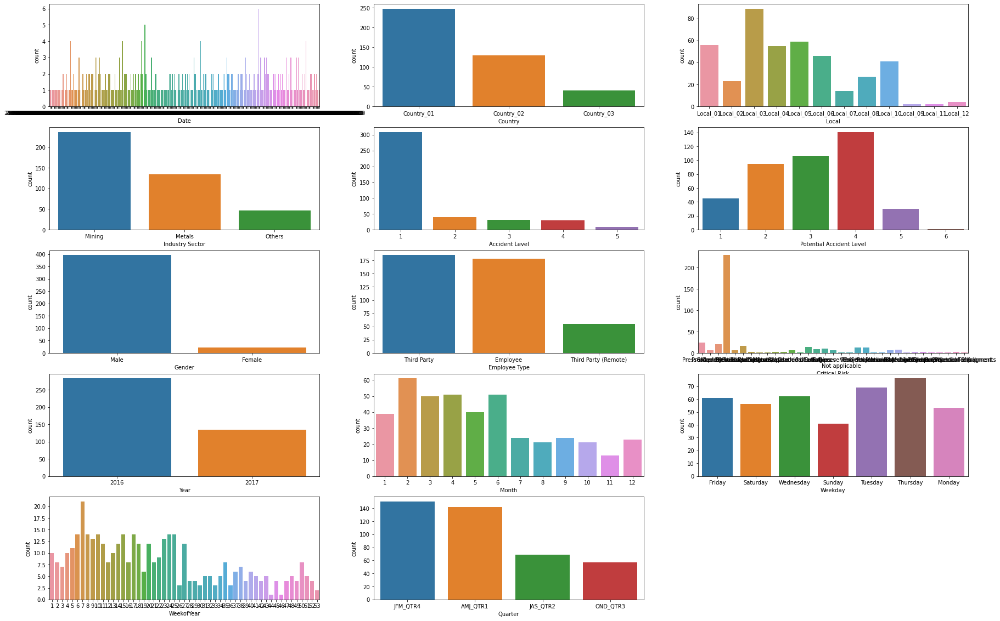

In [ ]:
plt.figure(figsize= (30,20))               # Set the figure size
pos = 1                                    # a variable to manage the position of the subplot in the overall plot
for feature in safety_df.columns:                 # for-loop to iterate over every attribute whose distribution is to be visualized
    plt.subplot(5, 3, pos)                 # plot grid
    # Plot bar chart for categorical label 'status'
    sns.countplot(safety_df[feature])
    pos += 1                            # to plot over the grid one by one  

Observations:
1. Certain date, there are more number of observations
2. Country_01 faced more number of accidents and Country_03 faced significantly less number of accidents
3. Significantly high number of male employees met with accidents as compared to female
4. 3rdparty-remote face faced significantly less number of accidents when compared to Employee or 3rd party
5. JFM Quarter-4 - more number of accidents


In [ ]:
safety_data['Critical Risk'].unique()      

array(['Pressed', 'Pressurized Systems', 'Manual Tools', 'Others',
       'Fall prevention (same level)', 'Chemical substances',
       'Liquid Metal', 'Electrical installation', 'Confined space',
       'Pressurized Systems / Chemical Substances',
       'Blocking and isolation of energies', 'Suspended Loads', 'Poll',
       'Cut', 'Fall', 'Bees', 'Fall prevention', '\nNot applicable',
       'Traffic', 'Projection', 'Venomous Animals', 'Plates',
       'Projection/Burning', 'remains of choco',
       'Vehicles and Mobile Equipment', 'Projection/Choco',
       'Machine Protection', 'Power lock', 'Burn',
       'Projection/Manual Tools', 'Individual protection equipment',
       'Electrical Shock', 'Projection of fragments'], dtype=object)

In [ ]:
safety_data.groupby(['Critical Risk'], sort=True).size()

Critical Risk
\nNot applicable                               1
Bees                                          10
Blocking and isolation of energies             3
Burn                                           1
Chemical substances                           17
Confined space                                 1
Cut                                           14
Electrical Shock                               2
Electrical installation                        1
Fall                                           9
Fall prevention                                6
Fall prevention (same level)                   7
Individual protection equipment                1
Liquid Metal                                   3
Machine Protection                             2
Manual Tools                                  20
Others                                       229
Plates                                         1
Poll                                           1
Power lock                                     3
Presse

In [ ]:
risk_type = safety_data.groupby('Critical Risk').count().sort_values(by=['Date'], ascending = True).reset_index()

(array([  0.,  50., 100., 150., 200., 250.]),
 <a list of 6 Text major ticklabel objects>)

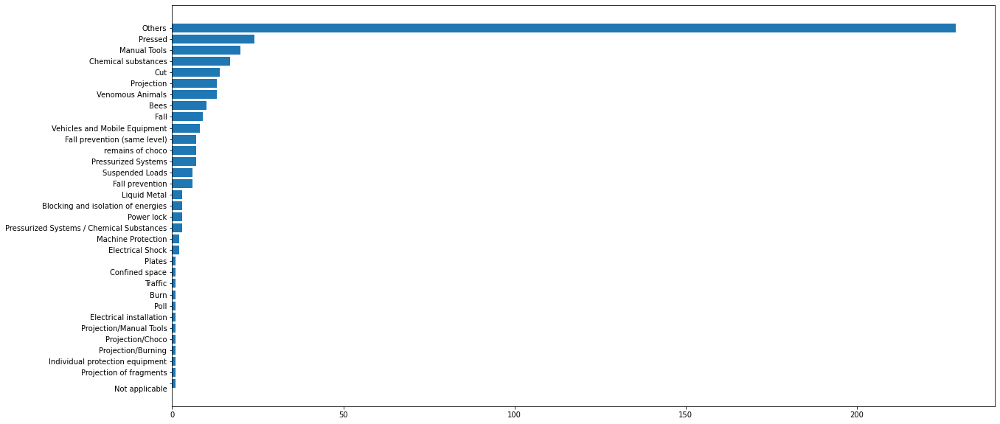

In [ ]:
plt.figure(figsize=(20,10))
plt.barh(risk_type['Critical Risk'],risk_type['Date'])
plt.xticks(rotation = 'horizontal')

#### Understand the countrywise Injuries or Accidents in Plants

In [ ]:
import plotly.express as px

In [ ]:
fig = px.pie(safety_data, names='Country', template='seaborn')
fig.update_traces(rotation=45, pull=[0.1,0.01,0.1,0.01,0.1], textinfo="percent+label", showlegend=True)
fig.show()

It shows Couontry_01 is highly impacted followed by Country_02 and Country_03.

Approximatelly 60% of accidents happends in Country_01. We need to understand what type of accidents happen in Country_01

##### Understand the Genderwise Injuries or Accidents in Plants

In [ ]:
fig = px.pie(safety_data, names='Gender', template='seaborn')
fig.update_traces(rotation=45, pull=[0.1,0.01,0.1,0.01,0.1],textinfo="percent+label", showlegend=True)
fig.show()

It shows 95% of plant accidents or injuries happened to Male employees

In [ ]:
fig = px.pie(safety_data, names='Accident Level', template='seaborn')
fig.update_traces(rotation=45, pull=[0.1,0.01,0.1,0.01,0.1],textinfo="percent+label", showlegend=True)
fig.show()

Accident Level I occured 73% of times

In [ ]:
fig = px.pie(safety_data, names='Potential Accident Level', template='seaborn')
fig.update_traces(rotation=45, pull=[0.1,0.01,0.1,0.01,0.1],textinfo="percent+label", showlegend=True)
fig.show()

But, potential accident level shows Type IV ie more severe accident (33%), that means 1/3 of accident could be potenial to have Type-IV accident level

### EDA - Multivariate Analysis

In [ ]:
safety_data.groupby(['Country']).size()

Country
Country_01    248
Country_02    129
Country_03     41
dtype: int64

Country_01 has appx 60% of incidents

In [ ]:
safety_data.groupby(['Country', 'Accident Level']).size()

Country     Accident Level
Country_01  1                 177
            2                  19
            3                  21
            4                  23
            5                   8
Country_02  1                  98
            2                  19
            3                   7
            4                   5
Country_03  1                  34
            2                   2
            3                   3
            4                   2
dtype: int64

42% of overall incidents was in Accident Level I and happend in Country_01

In [ ]:
def chart_Vs_AccLevel(data, feature):
    fig = plt.figure(figsize = (20, 10))
    ax = fig.add_subplot(121)
    sns.countplot(x = feature, data = data, ax = ax, orient = 'v',
                  hue = 'Accident Level').set_title(feature.capitalize() +' count plot by Accident Level', fontsize = 13)
                                                                      
    plt.legend(labels = data['Accident Level'].unique())
    plt.xticks(rotation = 90)
    
    ax = fig.add_subplot(122)
    sns.countplot(x = feature, data = data, ax = ax, orient = 'v', 
                  hue = 'Potential Accident Level').set_title(feature.capitalize() +' count plot by Potential Accident Level', 
                                                                      fontsize = 13)
    plt.legend(labels = data['Potential Accident Level'].unique())
    plt.xticks(rotation = 90)
    return plt.show()

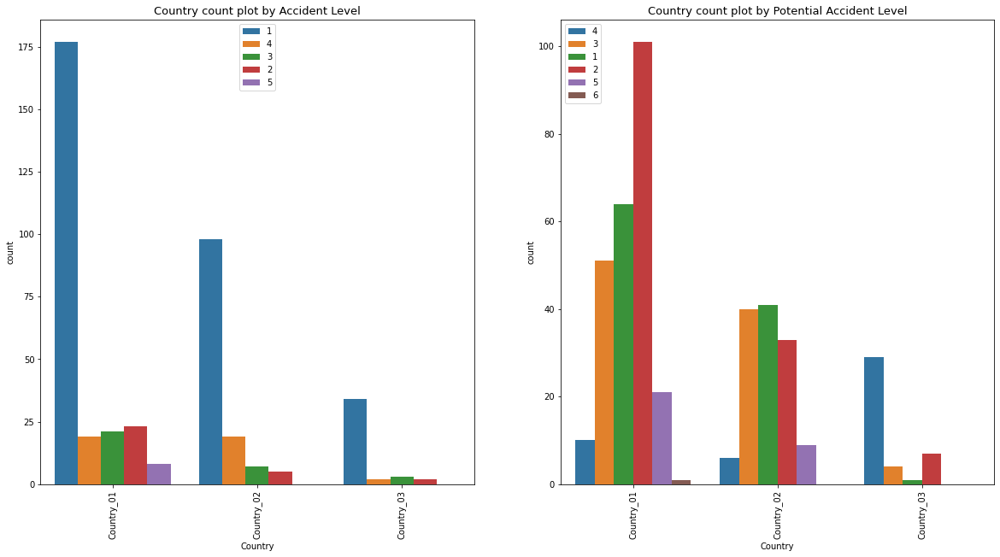

In [ ]:
chart_Vs_AccLevel(safety_data, 'Country')

Accident Level:
1. Shows majority of the accidents in all countries are Type-I accident followed by type-IV accident

Potential Accident Level:
1. In Country-1, type-II accident followed by type-I, Type-III, Type-V, Type-IV and Type VI (very serious)
2. In Country-2, Type I followed by type III, type II, type V and type IV
3. In Country-3, type IV followed by type II, Type III and type I

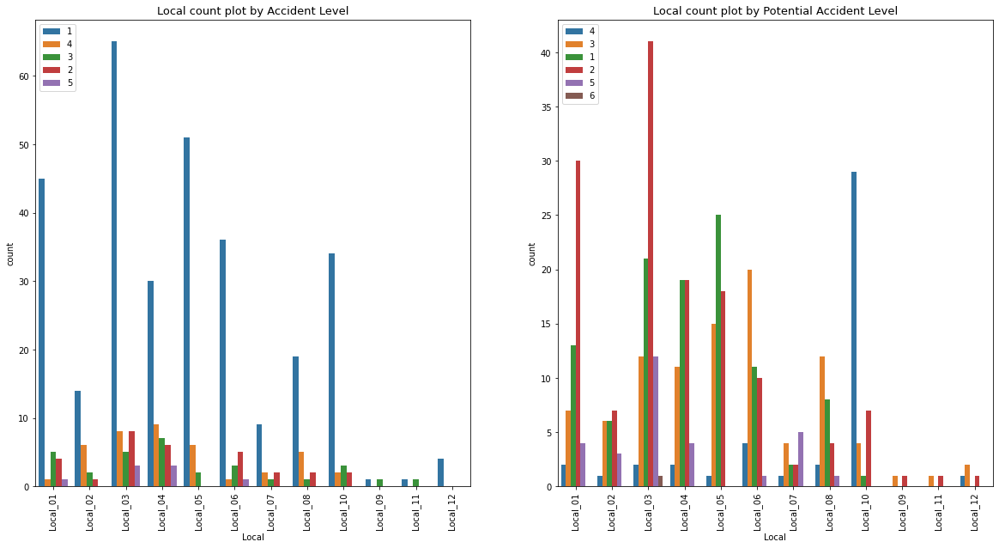

In [ ]:
chart_Vs_AccLevel(safety_data, 'Local')

In [ ]:
#safety_data.groupby(['Country', 'Local', 'Accident Level']).size()
safety_data.groupby(['Country', 'Local']).size()

Country     Local   
Country_01  Local_01    56
            Local_03    89
            Local_04    55
            Local_06    46
            Local_11     2
Country_02  Local_02    23
            Local_05    59
            Local_07    14
            Local_08    27
            Local_09     2
            Local_12     4
Country_03  Local_10    41
dtype: int64

Location_03 which is in Country_01 has experienced more accidents followed by Location_05 in Country_02

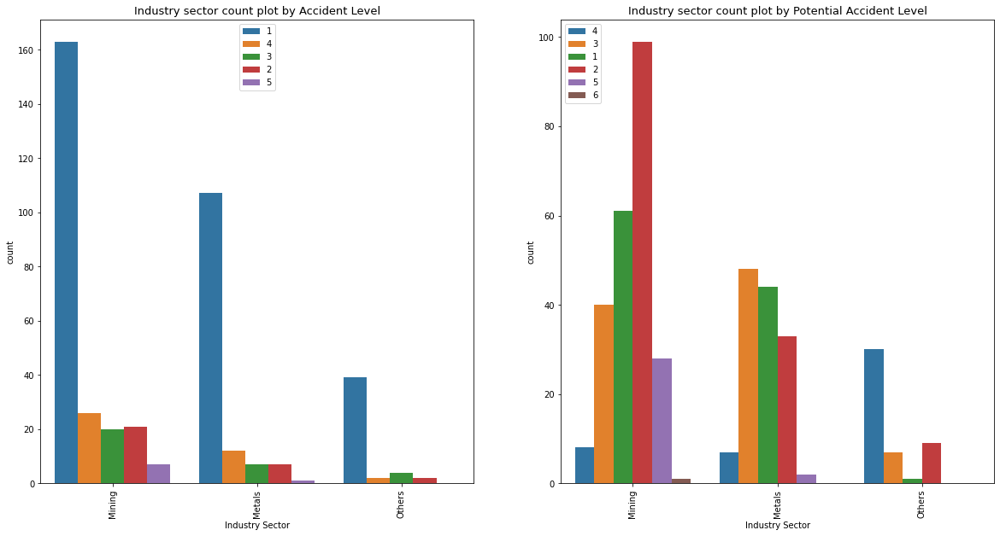

In [ ]:
chart_Vs_AccLevel(safety_data,'Industry Sector')

In [ ]:
#safety_data.groupby(['Country', 'Accident Level', 'Local', 'Industry Sector']).size()
safety_data.groupby(['Country', 'Local', 'Industry Sector']).size()

Country     Local     Industry Sector
Country_01  Local_01  Mining             56
            Local_03  Mining             89
            Local_04  Mining             55
            Local_06  Metals             46
            Local_11  Others              2
Country_02  Local_02  Mining             23
            Local_05  Metals             59
            Local_07  Mining             14
            Local_08  Metals             27
            Local_09  Metals              2
            Local_12  Others              4
Country_03  Local_10  Others             41
dtype: int64

1. In Country_01, Appx 80% of accidents occured in Mining industry sector in the location_01, location_03, location_04. Rest of the 20% occured in Metals and Others
2. In Country_02, appx 60% of accident occured in Metals in the location_05, location_08 and location_09. Rest of 40% occured in Mining and other areas
3. In Country_03, 100% of accidents occured in 'Other' industry sectors

**In Country_01, it shows clearly "Mining Industry Sector" is the highly accident prone area and Safety preventive actions to be taken care.........
In Country_02, "Metals Industry Sector" has experienced more accidents**

In [ ]:
safety_data.groupby(['Country', 'Critical Risk']).size()

Country     Critical Risk                            
Country_01  Blocking and isolation of energies             1
            Chemical substances                            4
            Cut                                            5
            Electrical Shock                               2
            Electrical installation                        1
            Fall                                           6
            Fall prevention                                3
            Fall prevention (same level)                   5
            Individual protection equipment                1
            Machine Protection                             1
            Manual Tools                                   7
            Others                                       169
            Plates                                         1
            Power lock                                     3
            Pressed                                        9
            Pressurized Systems

In Country_01 and Country_02, majority of the critical risks are mentioned as "Others". But in Country_03, risks like 'Bees and Venomous Animals' are given but the 'Industry sector' is not clear as it is mentioned as "Others"

In [ ]:
safety_data.groupby(['Country', 'Gender','Accident Level']).size()

Country     Gender  Accident Level
Country_01  Female  1                   6
                    3                   1
            Male    1                 171
                    2                  19
                    3                  20
                    4                  23
                    5                   8
Country_02  Female  1                  12
                    2                   3
            Male    1                  86
                    2                  16
                    3                   7
                    4                   5
Country_03  Male    1                  34
                    2                   2
                    3                   3
                    4                   2
dtype: int64

Male employees were involved in 41% of overall incidents/accidents in the categroy of Accident Level I and occured in Country_01 

In [ ]:
safety_data.groupby(['Country', 'Local', 'Industry Sector','Employee Type', 'Gender']).size()

Country     Local     Industry Sector  Employee Type         Gender
Country_01  Local_01  Mining           Employee              Male      23
                                       Third Party           Male      30
                                       Third Party (Remote)  Male       3
            Local_03  Mining           Employee              Female     1
                                                             Male      29
                                       Third Party           Female     1
                                                             Male      47
                                       Third Party (Remote)  Female     1
                                                             Male      10
            Local_04  Mining           Employee              Male      14
                                       Third Party           Female     1
                                                             Male      39
                                       Third

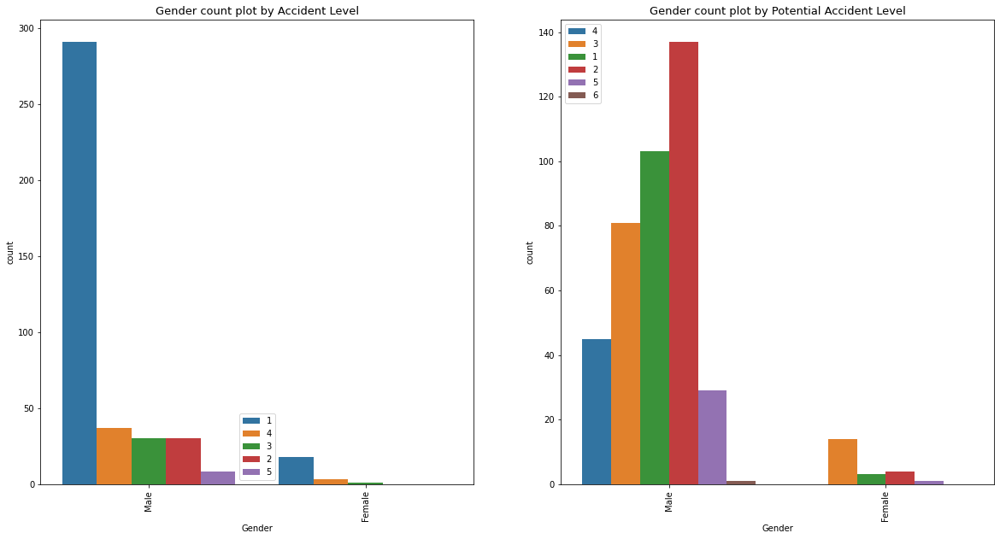

In [ ]:
chart_Vs_AccLevel(safety_data, 'Gender')

1. Both Accident Level and Potential accident Level is high for Male. May be significantly high Male would be working in ares where critical risk is high.
2. It shows, accident level is reduced as compared to "Potential accident level".
3. Both Male and Female employees faced Type-I accidents followed by Type-IV accidents

In [ ]:
safety_data.groupby(['Country', 'Local', 'Industry Sector','Employee Type']).size()

Country     Local     Industry Sector  Employee Type       
Country_01  Local_01  Mining           Employee                23
                                       Third Party             30
                                       Third Party (Remote)     3
            Local_03  Mining           Employee                30
                                       Third Party             48
                                       Third Party (Remote)    11
            Local_04  Mining           Employee                14
                                       Third Party             40
                                       Third Party (Remote)     1
            Local_06  Metals           Employee                18
                                       Third Party             20
                                       Third Party (Remote)     8
            Local_11  Others           Employee                 2
Country_02  Local_02  Mining           Employee                11
                

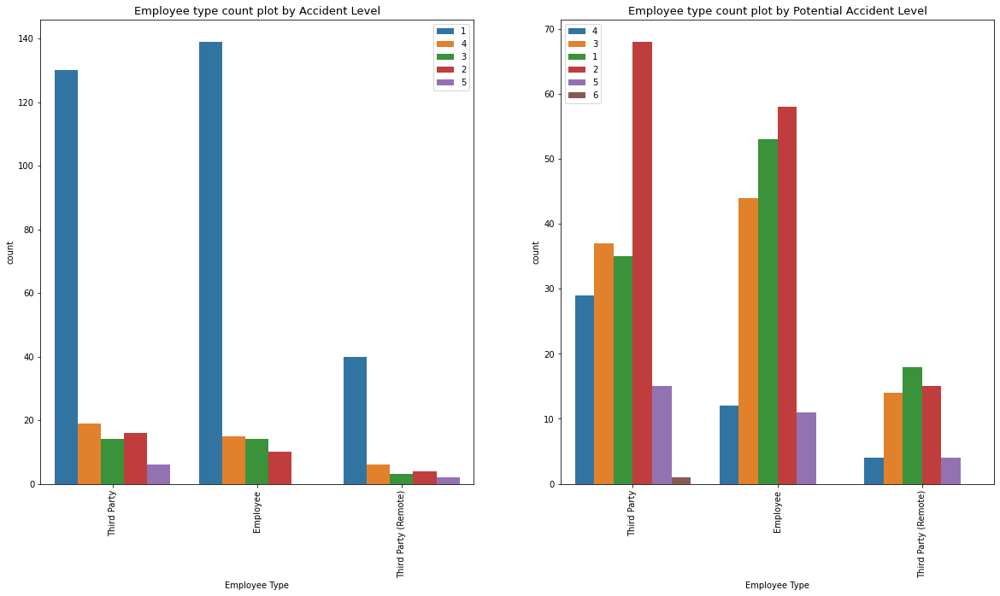

In [ ]:
chart_Vs_AccLevel(safety_data,'Employee Type')

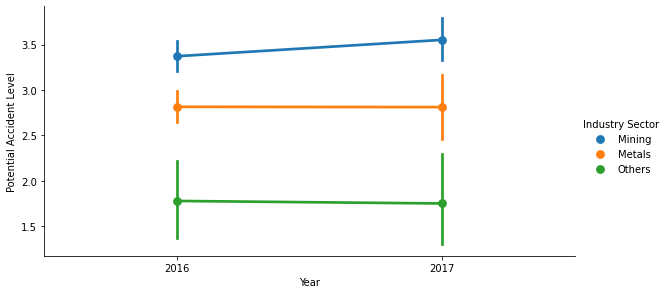

In [ ]:
sns.factorplot(x='Year', y='Potential Accident Level', data=safety_data, hue='Industry Sector', aspect=2, size=4)

Factor plot shows potential accidents remain the same for both the years. Only Mining has slight increase

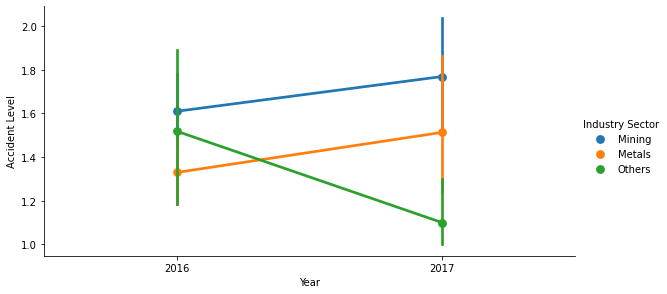

In [ ]:
sns.factorplot(x='Year', y='Accident Level', data=safety_data, hue='Industry Sector', aspect=2, size=4)

Factor plot shows, Accident level significantly reduced in other sectors. But, there is a slight increase in 2017 as comparted to 2016

### Analysis of Features

In [ ]:
piv_accident_level =safety_data.pivot_table(index='Month', columns=[ 'Year','Accident Level'], aggfunc='count')['Country']

In [ ]:
piv_accident_level

Year            2016                      2017                    
Accident Level     1    2    3    4    5     1    2    3    4    5
Month                                                             
1               11.0  NaN  NaN  1.0  NaN  21.0  2.0  2.0  1.0  1.0
2               23.0  4.0  2.0  1.0  1.0  19.0  5.0  2.0  4.0  NaN
3               24.0  4.0  3.0  3.0  NaN  10.0  3.0  NaN  NaN  3.0
4               23.0  1.0  3.0  1.0  NaN  20.0  1.0  NaN  2.0  NaN
5               23.0  2.0  NaN  1.0  NaN   8.0  1.0  1.0  3.0  1.0
6               26.0  1.0  NaN  3.0  1.0  15.0  2.0  2.0  1.0  NaN
7               11.0  1.0  4.0  2.0  1.0   5.0  NaN  NaN  NaN  NaN
8               15.0  3.0  2.0  1.0  NaN   NaN  NaN  NaN  NaN  NaN
9               18.0  3.0  2.0  1.0  NaN   NaN  NaN  NaN  NaN  NaN
10              11.0  4.0  4.0  2.0  NaN   NaN  NaN  NaN  NaN  NaN
11               9.0  1.0  1.0  2.0  NaN   NaN  NaN  NaN  NaN  NaN
12              17.0  2.0  3.0  1.0  NaN   NaN  NaN  NaN  NaN  NaN

In [ ]:
piv_potential_level =safety_data.pivot_table(index='Month', columns=[ 'Year','Potential Accident Level'], aggfunc='count')['Country']
piv_potential_level

Year                      2016                        ... 2017                      
Potential Accident Level     1    2     3     4    5  ...    2     3     4    5    6
Month                                                 ...                           
1                          1.0  1.0   5.0   5.0  NaN  ...  2.0  11.0  10.0  NaN  1.0
2                          2.0  9.0   6.0  10.0  4.0  ...  5.0   9.0   9.0  3.0  NaN
3                          1.0  7.0  11.0  13.0  2.0  ...  NaN   2.0   3.0  6.0  NaN
4                          NaN  6.0  10.0   9.0  3.0  ...  7.0   4.0   6.0  2.0  NaN
5                          5.0  3.0   9.0   8.0  1.0  ...  3.0   1.0   5.0  3.0  NaN
6                         10.0  4.0   9.0   6.0  2.0  ...  5.0   3.0  11.0  NaN  NaN
7                          NaN  6.0   2.0   9.0  2.0  ...  4.0   1.0   NaN  NaN  NaN
8                          1.0  7.0   7.0   6.0  NaN  ...  NaN   NaN   NaN  NaN  NaN
9                          4.0  9.0   4.0   7.0  NaN  ...  NaN   NaN   NaN  NaN  NaN
10                         NaN  4.0   5.0  12.0  NaN  ...  NaN   NaN   NaN  NaN  NaN
11                         2.0  5.0   1.0   4.0  1.0  ...  NaN   NaN   NaN  NaN  NaN
12                         NaN  8.0   6.0   8.0  1.0  ...  NaN   NaN   NaN  NaN  NaN

[12 rows x 11 columns]

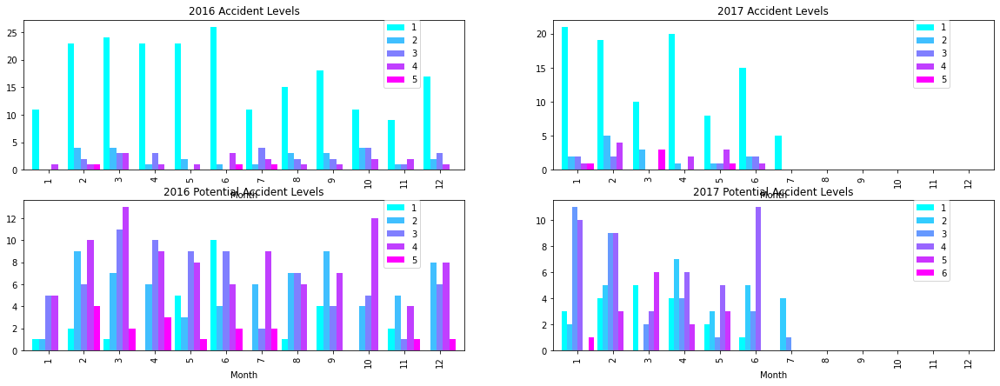

In [ ]:
fig = plt.figure(figsize=(20,7))
ax = fig.add_subplot(2, 2, 1)
piv_accident_level[2016].plot(kind='bar', ax=ax, width=0.9, cmap='cool', title='2016 Accident Levels')
plt.legend(bbox_to_anchor=(0.9, 1), loc=1, borderaxespad=0.)

ax = fig.add_subplot(2, 2, 2)
piv_accident_level[2017].plot(kind='bar', ax=ax, width=0.9, cmap='cool', title='2017 Accident Levels')
plt.legend(bbox_to_anchor=(0.9, 1), loc=1, borderaxespad=0.)

ax = fig.add_subplot(2, 2, 3)
piv_potential_level[2016].plot(kind='bar', ax=ax, width=0.9, cmap='cool', title='2016 Potential Accident Levels')
plt.legend(bbox_to_anchor=(0.9, 1), loc=1, borderaxespad=0.)

ax = fig.add_subplot(2, 2, 4)
piv_potential_level[2017].plot(kind='bar', ax=ax, width=0.9, cmap='cool', title='2017 Potential Accident Levels')
plt.legend(bbox_to_anchor=(0.9, 1), loc=1, borderaxespad=0.)

Above bar chart shows month-wise accident level and potential accident level distribution. In the year 2017, we have only data for 7 months.

This clearly shows, accident level is reduced when compared to potential accident level.

Most of the Accidents are Level I and occurred thru out the year eventhough the potential level of accidents is high.


### Accident Level Vs Potential Accident Level

In [ ]:
import holoviews as hv
import holoviews as hv
from holoviews import opts

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
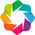

:Bars   [Severity,Levels]   (value)

In [ ]:
hv.extension('bokeh')

ac_level_cnt = np.round(safety_data['Accident Level'].value_counts(normalize=True) * 100)
pot_ac_level_cnt = np.round(safety_data['Potential Accident Level'].value_counts(normalize=True) * 100, decimals=1)
ac_pot = pd.concat([ac_level_cnt, pot_ac_level_cnt], axis=1,sort=False).fillna(0).rename(columns={'Accident Level':'Accident', 'Potential Accident Level':'Potential'})
ac_pot = pd.melt(ac_pot.reset_index(), ['index']).rename(columns={'index':'Severity', 'variable':'Levels'})
hv.Bars(ac_pot, ['Severity', 'Levels'], 'value').opts(opts.Bars(title="Accident Levels Count", width=700, height=300,tools=['hover'],\
                                                                show_grid=True,xrotation=45, ylabel="Percentage", yformatter='%d%%'))

This bar chart shows the comparison of Accident Level Vs Potential Accident Level
1. Type 1 - More number of accident happened than potential accident level assumed or predicted
2. Type 2 - Less number of accident happened than potential accident level assumed or predicted
3. Type 3 - Less number of accident happened than potential accident level assumed or predicted
4. Type 4 - Less number of accident happened than potential accident level assumed or predicted
5. Type 5 - Less number of accident happened than potential accident level assumed or predicted
6. Type 6 - No accident happened as compared to predicted

## Key Takeaways/Observations from EDA

1. Reason for Country_01 has more number of accidents
2. Reason for more male and 3rd party are affected by accidents? Are they trained or preventive actions taken?
3. Reason for Location_03 is more dangerous place to work.
4. Reason for more accidents on Thursday and JFM Quarter (Last Quarter of the year)

## Reason for Country_01 has more number of accidents: Mining Industry
In Country_01, Appx 80% of accidents occured in Mining industry sector. Mining Industry operats in location_01, location_03, location_04.



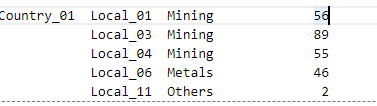

## Reason for more Male and 3rd party are affected by accidents : ## 
There could reasons like
1. Significantly more number of male and 3rd party employees working in Mining Industry where the most number of accidents happend.
2. Female employees took safety preventive actions. Hence, accidents not reported.

With the limited data, it would be difficult to identify the reason
### Are they trained or preventive actions taken : ##  
Yes, Data shows accident level is reduced as compared to potential accident levels. Type IV accidents happended in Country_01 (Mining) could be prevented

## Reason for Location_03 is more dangerous place to work ##
Industry Sector in this region is Mining 

## Reason for more accidents on Thursday and JFM Quarter (Last Quarter of the year) ##


In [ ]:
safety_data.groupby(['Country', 'Local', 'Industry Sector','Quarter']).size()

Country     Local     Industry Sector  Quarter 
Country_01  Local_01  Mining           AMJ_QTR1    23
                                       JAS_QTR2     5
                                       JFM_QTR4    23
                                       OND_QTR3     5
            Local_03  Mining           AMJ_QTR1    26
                                       JAS_QTR2    16
                                       JFM_QTR4    33
                                       OND_QTR3    14
            Local_04  Mining           AMJ_QTR1    17
                                       JAS_QTR2     7
                                       JFM_QTR4    18
                                       OND_QTR3    13
            Local_06  Metals           AMJ_QTR1    11
                                       JAS_QTR2    10
                                       JFM_QTR4    20
                                       OND_QTR3     5
            Local_11  Others           AMJ_QTR1     1
                                  

Data shows significantly more number of accidents occured during JFM Quarter. There could be reason more work was done during last quarter.

In [ ]:
safety_data.groupby(['Weekday','Country', 'Industry Sector']).size()

Weekday    Country     Industry Sector
Friday     Country_01  Metals              8
                       Mining             35
           Country_02  Metals             12
                       Mining              5
           Country_03  Others              1
Monday     Country_01  Metals              7
                       Mining             22
                       Others              1
           Country_02  Metals             17
                       Mining              4
           Country_03  Others              2
Saturday   Country_01  Metals              2
                       Mining             35
           Country_02  Metals              4
                       Mining              9
           Country_03  Others              6
Sunday     Country_01  Metals              9
                       Mining             23
           Country_02  Metals              6
                       Mining              2
           Country_03  Others              1
Thursday   Count

Based on the data, accident count is more on 'Friday' and 'Saturday' in the Mining Sector followed by Thursday.

As the data given is for only 1 hour, we can't assue these Weekdays and Quarter will have any direct impact on the accident level or potential accident level.

In [ ]:
safety_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      418 non-null    datetime64[ns]
 1   Country                   418 non-null    object        
 2   Local                     418 non-null    object        
 3   Industry Sector           418 non-null    object        
 4   Accident Level            418 non-null    int64         
 5   Potential Accident Level  418 non-null    int64         
 6   Gender                    418 non-null    object        
 7   Employee Type             418 non-null    object        
 8   Critical Risk             418 non-null    object        
 9   Description               418 non-null    object        
 10  Year                      418 non-null    int64         
 11  Month                     418 non-null    int64         
 12  Weekday               

In [ ]:
#Take a copy and apply encoding
safety_data_encod = copy.deepcopy(safety_data)

### Feature Selection and Importance

1. Chi2
2. Correlation with HeatMap
3. Feature Importance using XGBoost Classifier

In [ ]:
safety_data_encod['Country'] = LabelEncoder().fit_transform(safety_data_encod['Country'])
safety_data_encod['Local'] = LabelEncoder().fit_transform(safety_data_encod['Local'])
safety_data_encod['Industry Sector'] = LabelEncoder().fit_transform(safety_data_encod['Industry Sector'])
safety_data_encod['Gender'] = LabelEncoder().fit_transform(safety_data_encod['Gender'])
safety_data_encod['Employee Type'] = LabelEncoder().fit_transform(safety_data_encod['Employee Type'])
safety_data_encod['Critical Risk'] = LabelEncoder().fit_transform(safety_data_encod['Critical Risk'])
safety_data_encod['Quarter'] = LabelEncoder().fit_transform(safety_data_encod['Quarter'])

In [ ]:
safety_data_encod['Weekday'].unique()

array(['Friday', 'Saturday', 'Wednesday', 'Sunday', 'Tuesday', 'Thursday',
       'Monday'], dtype=object)

In [ ]:
## Change the object/string reporesentation of Weekday to Integers 
weekday_t = {'Monday': 1, 'Tuesday': 2,'Wednesday': 3 , 'Thursday' : 4, 'Friday': 5, 'Saturday' : 6, 'Sunday' : 7}
safety_data_encod['Weekday'] = pd.Series([weekday_t[x] for x in safety_data_encod['Weekday']], index=safety_data_encod.index)

In [ ]:
safety_data_encod['Weekday'].unique()

array([5, 6, 3, 7, 2, 4, 1])

In [ ]:
safety_data_encod.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      418 non-null    datetime64[ns]
 1   Country                   418 non-null    int64         
 2   Local                     418 non-null    int64         
 3   Industry Sector           418 non-null    int64         
 4   Accident Level            418 non-null    int64         
 5   Potential Accident Level  418 non-null    int64         
 6   Gender                    418 non-null    int64         
 7   Employee Type             418 non-null    int64         
 8   Critical Risk             418 non-null    int64         
 9   Description               418 non-null    object        
 10  Year                      418 non-null    int64         
 11  Month                     418 non-null    int64         
 12  Weekday               

In [ ]:
#safety_data_encod = safety_data_encod.drop(columns=['Description_length','Month','Year','WeekofYear'], axis=1)
safety_data_encod = safety_data_encod.drop(columns=['Month','Year','WeekofYear'], axis=1)

In [ ]:
from sklearn.feature_selection import f_classif, chi2, mutual_info_classif
from statsmodels.stats.multicomp import pairwise_tukeyhsd

X = safety_data_encod.drop(columns=['Accident Level', 'Potential Accident Level','Date', 'Description'], axis=1)

In [ ]:
y = safety_data_encod['Potential Accident Level']

#### 1. Univariate Selection Statistical tests - chi2 #### 
To select features that have the strongest relationship with the output variable. 
chi-squared (chi²) statistical test for non-negative features to select the best features

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [ ]:
#apply SelectKBest class to extract top best features
bestfeatures = SelectKBest(score_func=chi2, k=7)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(7,'Score'))  #print 10 best features

             Specs       Score
1            Local  207.499104
0          Country   88.305664
5    Critical Risk   42.155724
2  Industry Sector   41.679364
7          Quarter    5.163549
6          Weekday    2.971151
4    Employee Type    1.424797


#### 2. Correlation Matrix with Heatmap

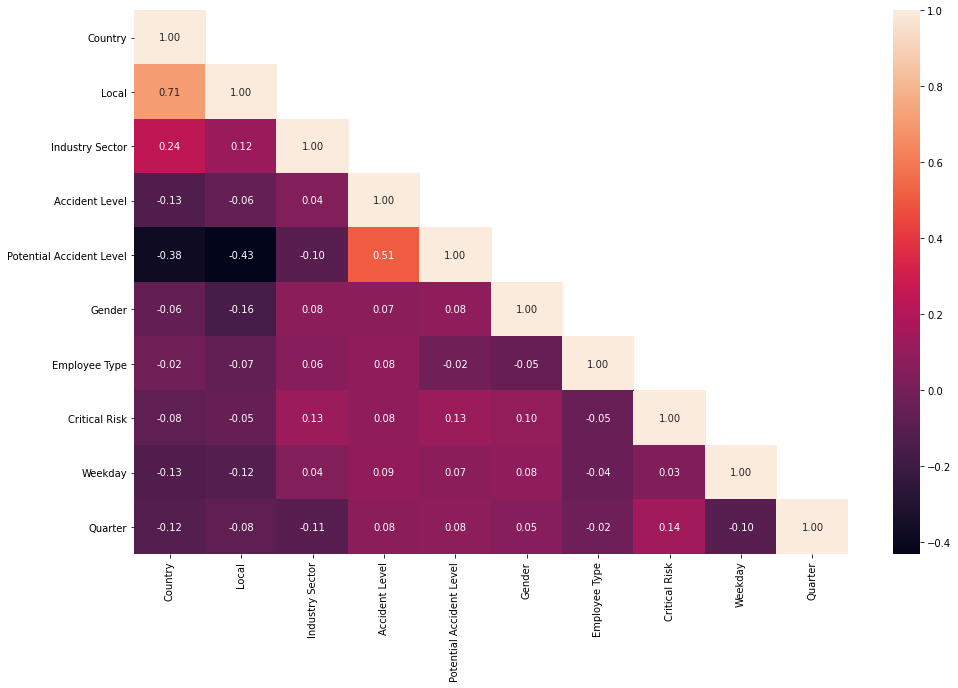

In [ ]:
# Correlation matrix

corr1 = safety_data_encod.corr()
mask1=np.zeros_like(corr1);
mask1[np.triu_indices_from(mask1, 1)] = True

plt.figure(figsize=(16,10))
sns.heatmap(corr1,annot=True, fmt = '.2f', mask=mask1)

Here are the observations:
1. +ve correlation between Potential Accident Level and Accident Level (0.51)
2. +ve Correlation between Critical Risk and Quarter (0.14). There could be reason that certain work is done in particular quarter
3. Critical Risk has +ve correlation between Industry Sector, Accident Level, Potential Level, Gender, 
4. Gender and Employee type has +ve Industry sector, Accident Level 
5. Country has high +ve(0.71) correlation to Local and Industry Sector (0.24)

#### Feature Importance using XGBOOST

[0.3495127  0.11577629 0.16157305 0.12624583 0.04973182 0.06952989
 0.06389433 0.06373607]


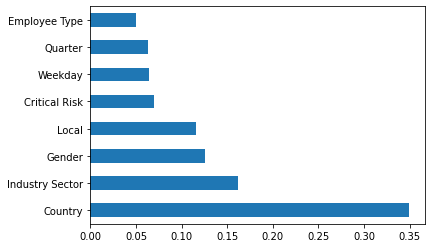

In [ ]:
from sklearn.datasets import make_classification
from xgboost import XGBClassifier
model = XGBClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

Irrelevant or partially relevant features can negatively impact model performance.
Feature selection and Data cleaning should be the first and most important step of your model designing.
Feature Selection is the process where you automatically or manually select those features which contribute most to your prediction variable 

**Here, country has high feature importance followed by Industry Sector, Gender, Local, Critical Risk, Weekday, Quarter and Employee Type**

In [ ]:
safety_data_encod.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      418 non-null    datetime64[ns]
 1   Country                   418 non-null    int64         
 2   Local                     418 non-null    int64         
 3   Industry Sector           418 non-null    int64         
 4   Accident Level            418 non-null    int64         
 5   Potential Accident Level  418 non-null    int64         
 6   Gender                    418 non-null    int64         
 7   Employee Type             418 non-null    int64         
 8   Critical Risk             418 non-null    int64         
 9   Description               418 non-null    object        
 10  Weekday                   418 non-null    int64         
 11  Quarter                   418 non-null    int64         
dtypes: datetime64[ns](1), 

In [ ]:
#Take a copy for creating featured data for ML
safety_data_ml = copy.deepcopy(safety_data)
safety_data_nlp = copy.deepcopy(safety_data)


### Pre-Processed Data for ML

In [ ]:
safety_data_ml['Country'] = LabelEncoder().fit_transform(safety_data_ml['Country'])
safety_data_ml['Local'] = LabelEncoder().fit_transform(safety_data_ml['Local'])
safety_data_ml['Critical Risk'] = LabelEncoder().fit_transform(safety_data_ml['Critical Risk'])

In [ ]:
## Change the object/string reporesentation of Weekday to Integers 
weekday_t    = {'Monday': 1, 'Tuesday': 2,'Wednesday': 3 , 'Thursday' : 4, 'Friday': 5, 'Saturday' : 6, 'Sunday' : 7}
emp_type_e   = {'Employee' : 1, 'Third Party' : 2, 'Third Party (Remote)' :3}
ind_sector_e = {'Mining' :1 , 'Metals' : 2 , 'Others': 3 }
gender_e     = { 'Male' : 1, 'Female':2}
quarter_e    = {'AMJ_QTR1': 1, 'JAS_QTR2' : 2, 'OND_QTR3' : 3, 'JFM_QTR4': 4}

safety_data_ml['Weekday'] = pd.Series([weekday_t[x] for x in safety_data_ml['Weekday']], index=safety_data_ml.index)
safety_data_ml['Employee Type'] = pd.Series([emp_type_e[x] for x in safety_data_ml['Employee Type']], index=safety_data_ml.index)
safety_data_ml['Industry Sector'] = pd.Series([ind_sector_e[x] for x in safety_data_ml['Industry Sector']], index=safety_data_ml.index)
safety_data_ml['Gender'] = pd.Series([gender_e[x] for x in safety_data_ml['Gender']], index=safety_data_ml.index)
safety_data_ml['Quarter'] = pd.Series([quarter_e[x] for x in safety_data_ml['Quarter']], index=safety_data_ml.index)

#### Based on Feature Importance - dropped the following fields

'Month', 'Year', 'WeekofYear'

In [ ]:
safety_data_ml = safety_data_ml.drop(columns=['Date','Month','Year','WeekofYear'], axis=1)

In [ ]:
column_names =['Country', 'Industry Sector', 'Gender' , 'Local' , 'Critical Risk', 'Weekday', 'Quarter', 'Employee Type', 'Description', 'Description_length', 'Accident Level', 'Potential Accident Level'] 

In [ ]:
safety_data_ml = safety_data_ml.reindex(columns=column_names)

In [ ]:
safety_data_ml.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Country                   418 non-null    int64  
 1   Industry Sector           418 non-null    int64  
 2   Gender                    418 non-null    int64  
 3   Local                     418 non-null    int64  
 4   Critical Risk             418 non-null    int64  
 5   Weekday                   418 non-null    int64  
 6   Quarter                   418 non-null    int64  
 7   Employee Type             418 non-null    int64  
 8   Description               418 non-null    object 
 9   Description_length        0 non-null      float64
 10  Accident Level            418 non-null    int64  
 11  Potential Accident Level  418 non-null    int64  
dtypes: float64(1), int64(10), object(1)
memory usage: 62.5+ KB


### Pre-Processed Data for NLP

In [ ]:
safety_data_nlp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      418 non-null    datetime64[ns]
 1   Country                   418 non-null    object        
 2   Local                     418 non-null    object        
 3   Industry Sector           418 non-null    object        
 4   Accident Level            418 non-null    int64         
 5   Potential Accident Level  418 non-null    int64         
 6   Gender                    418 non-null    object        
 7   Employee Type             418 non-null    object        
 8   Critical Risk             418 non-null    object        
 9   Description               418 non-null    object        
 10  Year                      418 non-null    int64         
 11  Month                     418 non-null    int64         
 12  Weekday               

In [ ]:
safety_data_nlp = safety_data_nlp.drop(columns=['Date','Month','Year','WeekofYear'], axis=1)

In [ ]:
safety_data_nlp = safety_data_nlp.drop(columns=['Weekday', 'Quarter'], axis=1)

In [ ]:
safety_data_nlp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Country                   418 non-null    object
 1   Local                     418 non-null    object
 2   Industry Sector           418 non-null    object
 3   Accident Level            418 non-null    int64 
 4   Potential Accident Level  418 non-null    int64 
 5   Gender                    418 non-null    object
 6   Employee Type             418 non-null    object
 7   Critical Risk             418 non-null    object
 8   Description               418 non-null    object
dtypes: int64(2), object(7)
memory usage: 52.7+ KB


In [ ]:
safety_data_nlp = safety_data_nlp.reindex(columns=column_names)

### Download the clean and feature Importance File for ML and NLP Processing

In [ ]:
filename_ml = 'safety_data_ml.csv'
filename_nlp = 'safety_data_nlp.csv'

safety_data_ml.to_csv(project_path+filename_ml, index = False)
safety_data_nlp.to_csv(project_path+filename_nlp, index = False)

# Milestone 2

## Step 1: NLP pre processing

List of NLP Pre-Processing
1. Lowercase all texts
2. Remove punctuation
3. Tokenization
4. Remove Stopwords
5. Stemming
6. Lemmatization


In [ ]:
import re
import nltk
import spacy
import string
from collections import Counter
from nltk.stem import WordNetLemmatizer

pd.options.mode.chained_assignment = None

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('brown')
nltk.download('names')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package brown to /root/nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package names to /root/nltk_data...
[nltk_data]   Package names is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [ ]:
from nltk.corpus import stopwords

In [ ]:
from nltk.util import ngrams
from wordcloud import WordCloud, STOPWORDS

In [ ]:
!pip install normalise
from normalise import normalise
import en_core_web_sm
nlp = en_core_web_sm.load()

In [ ]:
class TextProcessor():
  def __init__(self, text_df):
    self.lemmatizer = WordNetLemmatizer()
    cnt = Counter()
    for text in text_df["Description"].values:
      for word in text.split():
        if word.lower() not in stopwords.words('english'):
          cnt[word] += 1
    n_words = 10      
    self.most_frequent_words = set([w for (w, wc) in cnt.most_common(n_words)])
    print(f'Top {n_words} frequent words : {self.most_frequent_words}')
    self.most_infrequent_words = set([w for (w, wc) in cnt.most_common()[:-n_words-1:-1]])
    print(f'Top {n_words} rare words : {self.most_infrequent_words}')    


  def remove_punctuation(self, text):    
    return text.translate(str.maketrans(' ', ' ', string.punctuation))

  #def remove_names(self, text):    
  #  # print(text)
  #  orig_words_list = text.split()
  #  tagged_sentence = nltk.tag.pos_tag(orig_words_list)
  #  word_list = [word for word,tag in tagged_sentence if tag != 'NNP' and tag != 'NNPS']
  #  print(f'Removed proper noun(s) : {set(orig_words_list)-set(word_list)}')
  #  return ' '.join(word for word in word_list)

  def remove_words(self, text, removable_words):
    return " ".join([word for word in text.split() if word not in removable_words])    

  def preprocess(self, text_df):
    #print("Removing proper nouns") 
    # remove names - like Anthony, cristóbal, eduardo eric fernández
    # TODO - check whether this is removing too many words, especially the ones starting with capital letter
    #text_df["Description"] = text_df["Description"].apply(lambda text: self.remove_names(text))

    print("Converting to lower case")
    text_df["Description"] = text_df["Description"].str.lower()

    print("Removing standard punctuations")
    text_df["Description"] = text_df["Description"].apply(lambda text: self.remove_punctuation(text))

    print("Removing Stopwords")
    EXCLUDED_REMOVE_WORDS={'hand'}
    rem_words_set = {"x", "cm", "kg", "mr", "nv", "da", "pm", "am", "cx" }
    new_words_remove ={ "cause", "employee", "activity","right", "leave", 
                        "worker","operator", "collaborator", 
                        "one", "two", "second", "third", 
                        "generate", "right", "time", "perform", "moment",
                        "assistant", "approximate", "describe", "mechanic", "company", "work", "support"}
    
    # remove frequent words that not contribute to model
    # words_to_remove = rem_words_set.union(set(stopwords.words('english'))).union(self.most_frequent_words).union(self.most_infrequent_words).difference(EXCLUDED_REMOVE_WORDS)
    words_to_remove = rem_words_set.union(set(stopwords.words('english')))
    print("expected words to remove ", words_to_remove)
    print(f"Removing {words_to_remove}")
    text_df["Description"] = text_df["Description"].apply(lambda text: self.remove_words(text, words_to_remove))

    print("Lemmatizing")
    text_df["Description"] = text_df["Description"].apply(lambda text: ' '.join([t.lemma_ for t in nlp(text)]))

    print("Removing words containing numbers - like cx695, 945")
    text_df["Description"] = text_df["Description"].apply(lambda text: ' '.join(s for s in text.split() if not any(c.isdigit() for c in s)))
    
    print(f"Removing {new_words_remove}")
    print("expected new words to remove ", new_words_remove)
    text_df["Description"] = text_df["Description"].apply(lambda text: self.remove_words(text, new_words_remove))
    return text_df

In [ ]:
text_processed = TextProcessor(safety_data_nlp)
safety_data_nlp_new = text_processed.preprocess(safety_data_nlp.copy())
safety_data_nlp_new['Description'].head() 


Top 10 frequent words : {'activity', 'area', 'operator', 'injury', 'causing', 'left', 'hand', 'employee', 'right', 'time'}
Top 10 rare words : {'endured', 'weevils', 'bra', 'environmental', 'swarming', 'laundry', 'stripping', 'cathodes', 'camp', 'grabbed'}
Converting to lower case
Removing standard punctuations
Removing Stopwords
expected words to remove  {"shouldn't", 'through', 'once', 'can', 'don', 'your', 's', 'da', 're', "wouldn't", 'some', 'about', 'hadn', 'ourselves', 'while', 'from', 'down', 'but', 'doing', 'mr', 'into', 'not', "you've", 'those', 'hers', 'against', 'this', 'couldn', 'and', 'during', 've', 'how', "hasn't", 'at', 'weren', 'll', 'wasn', 'any', "you'll", 'with', 'their', "she's", "it's", 'on', 'i', 'ours', 'between', 'or', 'there', 'ma', 'if', 'up', 'she', 'below', 'me', 'that', 'again', 'which', "weren't", 'd', 'mightn', "should've", 'so', 'we', 'theirs', 'kg', 'was', "isn't", 'themselves', "haven't", "aren't", 'by', 'hasn', "won't", 'such', "didn't", 'no', 'shan'

0    remove drill rod jumbo maintenance supervisor ...
1    activation sodium sulphide pump piping uncoupl...
2    sub station milpo locate level excavation pick...
3    approximately personnel begin task unlocking s...
4    approximately circumstance anthony group leade...
Name: Description, dtype: object

In [ ]:
safety_data_nlp_new.head() 

,Country,Industry Sector,Gender,Local,Critical Risk,Weekday,Quarter,Employee Type,Description,Description_length,Accident Level,Potential Accident Level
0,Country_01,Mining,Male,Local_01,Pressed,NaN,NaN,Third Party,remove drill rod jumbo maintenance supervisor ...,NaN,1,4
1,Country_02,Mining,Male,Local_02,Pressurized Systems,NaN,NaN,Employee,activation sodium sulphide pump piping uncoupl...,NaN,1,4
2,Country_01,Mining,Male,Local_03,Manual Tools,NaN,NaN,Third Party (Remote),sub station milpo locate level excavation pick...,NaN,1,3
3,Country_01,Mining,Male,Local_04,Others,NaN,NaN,Third Party,approximately personnel begin task unlocking s...,NaN,1,1
4,Country_01,Mining,Male,Local_04,Others,NaN,NaN,Third Party,approximately circumstance anthony group leade...,NaN,4,4


In [ ]:
def ngram_func(ngram, trg='', trg_value=''):
    #trg_value is list-object
    if (trg == '') or (trg_value == ''):
        string_filterd =  safety_data_nlp_new['Description'].sum().split()
    else:
        string_filterd =  safety_data_nlp_new[safety_data_nlp_new[trg].isin(trg_value)]['Description'].sum().split()
    dic = nltk.FreqDist(nltk.ngrams(string_filterd, ngram)).most_common(50)
    ngram_df = pd.DataFrame(dic, columns=['ngram','count'])
    ngram_df.index = [' '.join(i) for i in ngram_df.ngram]
    ngram_df.drop('ngram',axis=1, inplace=True)
    return ngram_df

In [ ]:
from bokeh.io import output_notebook
output_notebook()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
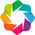

:Bars   [index]   (count)

In [ ]:
hv.extension('bokeh')
hv.Bars(ngram_func(1)[::-1]).opts(title="Industry Safety : Description -> Unigram Count Top-50 ", color="orange", xlabel="Unigrams", ylabel="Count")\
                .opts(opts.Bars(width=700, height=700,tools=['hover'],show_grid=True,invert_axes=True))

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
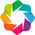

:Bars   [index]   (count)

In [ ]:
hv.extension('bokeh')
hv.Bars(ngram_func(2)[::-1]).opts(title="Industry Safety : Description -> Bigram Count Top-50", color="green", xlabel="Bigrams", ylabel="Count")\
                .opts(opts.Bars(width=700, height=700,tools=['hover'],show_grid=True,invert_axes=True))

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
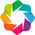

:Bars   [index]   (count)

In [ ]:
hv.extension('bokeh')
hv.Bars(ngram_func(3)[::-1]).opts(title="Industry Safety : Description -> Trigram Count Top-50 ", color="pink", xlabel="Trigrams", ylabel="Count")\
       .opts(opts.Bars(width=700, height=700,tools=['hover'],show_grid=True,invert_axes=True))

In [ ]:
unigram_df = (ngram_func(1)[::-1])
bigram_df = (ngram_func(2)[::-1])
trigram_df = (ngram_func(3)[::-1])

In [ ]:
unigram_df.sort_values(by='count', ascending=False)
#df.sort_values(by='col1', ascending=False)

,count
hand,152
use,102
hit,92
fall,80
area,75
equipment,73
finger,71
pipe,71
accident,68
make,65


In [ ]:
bigram_df.sort_values(by='count', ascending=False)

,count
finger hand,33
injury accident,20
left hand,18
injure person,15
fragment rock,14
medical center,14
make use,13
use safety,13
accident use,12
accident wear,11


In [ ]:
trigram_df.sort_values(by='count', ascending=False)

,count
accident wear safety,7
index finger hand,6
lose balance fall,5
injury accident use,5
make use safety,4
return initial position,4
place clerk wear,4
allergic reaction return,4
type allergic reaction,4
accident use safety,4


### WORDCLOUD showing the difference between BEFORE and AFTER TEXT Pre-processing

#### Before Text Pre-Processing

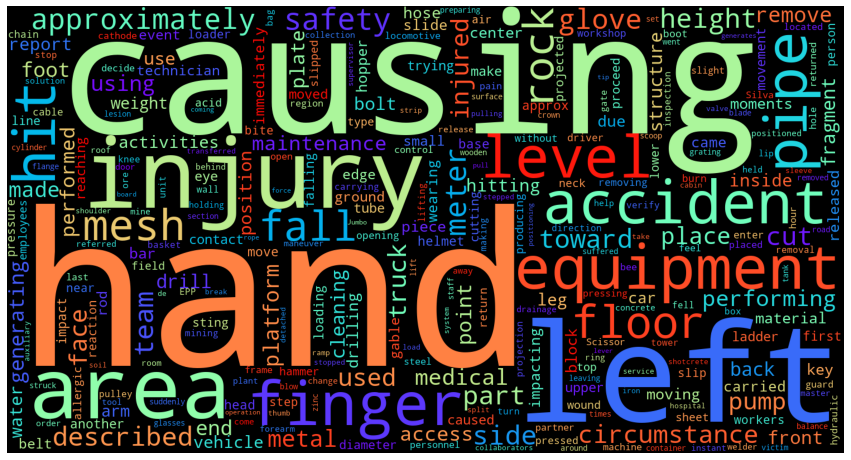

In [ ]:
wordcloud = WordCloud(width = 1500, height = 800, random_state=0, background_color='black', colormap='rainbow',\
                     min_font_size=5, max_words=300, collocations=False, stopwords = STOPWORDS).generate(" ".join(safety_data_nlp['Description'].values))
plt.figure(figsize=(15,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
STOPWORDS.update(["x", "cm", "kg", "mr", "nv", "da", "pm", "am", "cx", 
                  "cause", "employee", "activity","right", "leave", 
                  "worker", "operator", "collaborator", 
                  "one", "two", "second", "third", 
                  "generate", "right", "time", "perform", "moment",
                  "assistant", "approximate", "describe", "mechanic", "company", "work", "support"])
print(STOPWORDS)

{"shouldn't", "that's", 'can', 'once', 'through', 'your', "wouldn't", 'da', 'some', 'about', 'from', 'ourselves', 'while', 'down', 'but', 'doing', "can't", 'into', 'not', "who's", 'those', "you've", 'hers', 'mr', 'against', 'this', 'and', 'during', "hasn't", 'how', 'at', "i'd", 'any', "you'll", 'with', 'their', 'since', "she's", 'leave', 'could', 'k', "it's", 'ever', 'on', "they've", 'i', 'between', 'ours', 'or', 'there', 'if', 'moment', 'up', 'below', 'she', 'me', 'work', 'again', 'that', "they're", "weren't", 'which', 'www', 'like', 'otherwise', "i'll", 'so', 'worker', 'we', 'com', 'theirs', "she'll", 'kg', 'was', "isn't", "they'd", 'themselves', "haven't", 'however', "aren't", 'r', 'would', "why's", 'by', "won't", "didn't", 'such', 'no', 'before', "he's", 'of', 'operator', 'is', 'same', 'what', 'has', 'herself', 'further', 'http', 'cannot', 'other', 'then', "they'll", 'time', 'do', 'did', "where's", "what's", "couldn't", 'get', "hadn't", "here's", 'my', "you'd", 'in', 'cx', 'activit

#### AFter Text Pre-processing

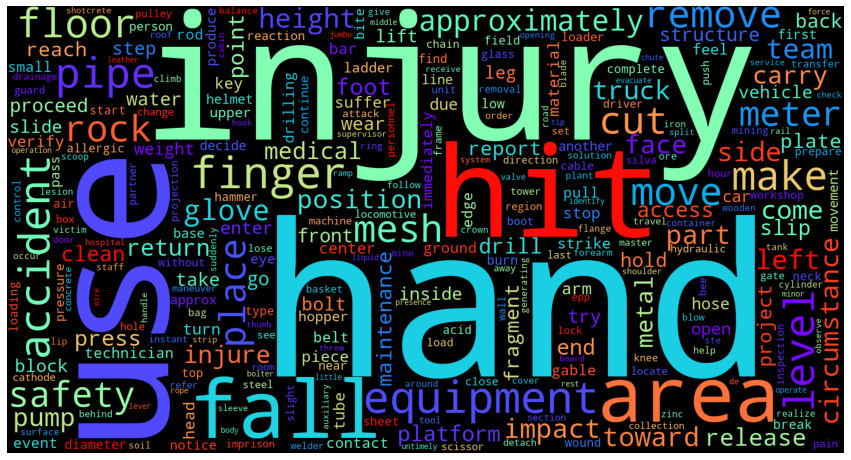

In [ ]:
wordcloud = WordCloud(width = 1500, height = 800, random_state=0, background_color='black', colormap='rainbow',\
                     min_font_size=5, max_words=300, collocations=False, stopwords = STOPWORDS).generate(" ".join(safety_data_nlp_new['Description'].values))
plt.figure(figsize=(15,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()


In [ ]:
safety_data_nlp_new.shape

(418, 12)

In [ ]:
maximum = max(safety_data_nlp_new["Description"].str.split().apply(len))
maximum

83

In [ ]:
len(safety_data_nlp_new['Description'][88].split())

55

In [ ]:
# copy and keep the original dataset 
safety_data_nlp_bkup = copy.deepcopy(safety_data_nlp_new)
feature_df1 = copy.deepcopy(safety_data_nlp_new)

### Remove the single record that has "Potential Accident Level" as 6. 

In [ ]:
feature_df1 = feature_df1[feature_df1['Potential Accident Level'] != 6]

In [ ]:
feature_df1.shape

(417, 12)

There are only 1 record with potential accident level as 6. Remove the record while processing.

In [ ]:
pot_acc_level = {1: 'POTACTA', 2: 'POTACTB', 3: 'POTACTC', 4 : 'POTACTD', 5: 'POTACTE'}
feature_df1['Potential Accident Level'] = pd.Series([pot_acc_level[x] for x in feature_df1['Potential Accident Level']], index=feature_df1.index)

In [ ]:
feature_df1.groupby('Potential Accident Level').size()

Potential Accident Level
POTACTA     45
POTACTB     95
POTACTC    106
POTACTD    141
POTACTE     30
dtype: int64

In [ ]:
#X_feat = safety_data_nlp_new.drop(columns=['Accident Level', 'Potential Accident Level'], axis=1)
#X_feat = feature_df1.drop(columns=['Accident Level', 'Potential Accident Level'], axis=1)
#y_label = feature_df1['Potential Accident Level']
X_feat = feature_df1.drop(columns=['Accident Level'], axis=1)
y_label = feature_df1['Accident Level']

X_feat.shape, y_label.shape

((417, 11), (417,))

In [ ]:
#X_concat = X_feat['Country'].map(str) + ' ' + X_feat['Industry Sector'].map(str) + ' ' + X_feat['Gender'].map(str) + ' ' + X_feat['Local'].map(str) + ' ' + X_feat['Critical Risk'].map(str) + ' ' + X_feat['Weekday'].map(str) + ' ' + X_feat['Quarter'].map(str) + ' ' + X_feat['Employee Type'].map(str) + ' ' + X_feat['Description'].map(str)
X_concat = X_feat['Country'].map(str) + ' ' + X_feat['Industry Sector'].map(str) + ' ' + X_feat['Gender'].map(str) + ' ' + X_feat['Local'].map(str) + ' ' + X_feat['Critical Risk'].map(str) + ' ' + X_feat['Employee Type'].map(str) + ' ' + X_feat['Description'].map(str) + ' ' + X_feat['Potential Accident Level'].map(str)

In [ ]:
X_concat[0]

'Country_01 Mining Male Local_01 Pressed Third Party remove drill rod jumbo maintenance supervisor proceed loosen intermediate centralizer facilitate removal see end drill equipment pull hand bar accelerate removal bar slide point tighten fingers drilling bar beam jumbo POTACTD'

In [ ]:
maximum = max(X_concat.str.split().apply(len))
maximum

92

In [ ]:
X_concat[2]

'Country_01 Mining Male Local_03 Manual Tools Third Party (Remote) sub station milpo locate level excavation pick hand tool hit rock flat part beak bounce hit steel tip safety shoe metatarsal area foot injury POTACTC'

In [ ]:
X_concat.shape

(417,)

In [ ]:
X_concat.head()

0    Country_01 Mining Male Local_01 Pressed Third ...
1    Country_02 Mining Male Local_02 Pressurized Sy...
2    Country_01 Mining Male Local_03 Manual Tools T...
3    Country_01 Mining Male Local_04 Others Third P...
4    Country_01 Mining Male Local_04 Others Third P...
dtype: object

In [ ]:
maximum1 = max(X_concat.str.split().apply(len))
maximum1

92

#### Input Record Distribution Details ###
##### Split the Train and Test set - Ratio 80: 20 #####

In [ ]:
#### Split the Train and Test set - 80: 20 as the input records are very less
# 7 is just any random seed number, targer y is not balanced hence included stratify =y

#X_train, X_test, y_train, y_test = train_test_split(X_concat, y, test_size=0.1, random_state=7, stratify=y)
X_train, X_test, y_train, y_test = train_test_split(X_concat, y_label, test_size=0.2, random_state=7)

In [ ]:
print('X_concat = ', X_concat.shape, ', X_train = ', X_train.shape, ', X_test = ', X_test.shape )
print('y_label = ', y_label.shape, ', y_train = ', y_train.shape, ', y_test = ', y_test.shape )

X_concat =  (417,) , X_train =  (333,) , X_test =  (84,)
y_label =  (417,) , y_train =  (333,) , y_test =  (84,)


In [ ]:
X_train.head()

163    Country_01 Metals Male Local_06 Pressed Third ...
182    Country_02 Mining Male Local_02 Others Third P...
389    Country_01 Mining Male Local_04 Fall Third Par...
309    Country_01 Mining Male Local_01 Vehicles and M...
302    Country_02 Mining Male Local_02 Others Third P...
dtype: object

In [ ]:
y_label[0]

1

### NLP - Tokenization, Encoding, Padding

In [ ]:
vocab_size = 20000  # Only consider the top 20k words
maxlen = 100  # Only consider the first 100 words of each work description

In [ ]:
# Initialize tokenizer with num_words = 20,000 -1 (keep most common 19,999 words)
tokenizer = Tokenizer(num_words=vocab_size)

# Fit the tokenizer object for X_train that contains headlines attrbutes
tokenizer.fit_on_texts(X_train)

# convert text to sequence - sequence encoding for train and test feature - headlines
train_encoding = tokenizer.texts_to_sequences(X_train)
test_encoding  = tokenizer.texts_to_sequences(X_test)

In [ ]:
len(train_encoding[0])

29

In [ ]:
num_words = len(tokenizer.word_index) + 1
print(num_words)

2273


In [ ]:
print("Pad each headlines with Maximum length = ", maxlen)

Pad each headlines with Maximum length =  100


In [ ]:
X_train = pad_sequences(train_encoding, maxlen=maxlen, padding='post')
X_test  = pad_sequences(test_encoding, maxlen=maxlen, padding='post')

In [ ]:
X_train[1]

array([   2,   11,    8,    3,    1,   11,    5,    6,    7,   34,   86,
         70,  126,  452,   62,   45,   10,   63, 1195,  150,  285,   15,
         16,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0], dtype=int32)

In [ ]:
#### Shape of features or headlines #####
print("Overall features shape = " ,X_concat.shape)
print("X_train shape          = ", X_train.shape)
print("X_test  shape          = ", X_test.shape)

Overall features shape =  (417,)
X_train shape          =  (333, 100)
X_test  shape          =  (84, 100)


In [ ]:
#### shape of label records #####
print("Overall labels shape = " , y.shape)
print("y_train shape        = ", y_train.shape)
print("y_test  shape        = ", y_test.shape)

Overall labels shape =  (418,)
y_train shape        =  (333,)
y_test  shape        =  (84,)


### Upsample Train dataset

In [ ]:
unique, counts = np.unique(y_train, return_counts=True)
dict(zip(unique, counts))

{1: 250, 2: 31, 3: 21, 4: 25, 5: 6}

In [ ]:
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
X_train_oversample, y_train_oversample = oversample.fit_resample(X_train, y_train)

In [ ]:
unique, counts = np.unique(y_train_oversample, return_counts=True)
dict(zip(unique, counts))

{1: 250, 2: 250, 3: 250, 4: 250, 5: 250}

### Convert Target variables to One Hot Encoding

In [ ]:
from keras.utils import np_utils
y_train = np_utils.to_categorical(np.asarray(y_train_oversample))
y_test_1 = np_utils.to_categorical(np.asarray(y_test))

print('y_label = ', y_label.shape,',y_train = ',y_train.shape, ', y_test =',y_test_1.shape)

y_label =  (417,) ,y_train =  (1250, 6) , y_test = (84, 6)


In [ ]:
y_train

array([[0., 0., 0., 1., 0., 0.],
       [0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1.],
       ...,
       [0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 1.]], dtype=float32)

In [ ]:
X_train = X_train_oversample
y_test = y_test_1

print('X = ', X_concat.shape,',X_train = ',X_train.shape, ', X_test =',X_test.shape)

X =  (417,) ,X_train =  (1250, 100) , X_test = (84, 100)


### Transformer block for NLP Transformer Nodel

In [ ]:
class TransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerBlock, self).__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = keras.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim),]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

### Embedding Layer for NLP Transformer Model

In [ ]:
class TokenAndPositionEmbedding(layers.Layer):
    def __init__(self, maxlen, vocab_size, embed_dim):
        super(TokenAndPositionEmbedding, self).__init__()
        self.token_emb = layers.Embedding(input_dim=vocab_size, output_dim=embed_dim)
        self.pos_emb = layers.Embedding(input_dim=maxlen, output_dim=embed_dim)

    def call(self, x):
        maxlen = tf.shape(x)[-1]
        positions = tf.range(start=0, limit=maxlen, delta=1)
        positions = self.pos_emb(positions)
        x = self.token_emb(x)
        return x + positions

### Create Embedding Matrix using Glove file - 300d for LSTM Model

In [ ]:
EMBEDDING_FILE = project_path + '/glove.6B.300d.txt'
embeddings = {}
for o in open(EMBEDDING_FILE):
    word = o.split(" ")[0]
    # print(word)
    embd = o.split(" ")[1:]
    embd = np.asarray(embd, dtype='float32')
    # print(embd)
    embeddings[word] = embd

# create a weight matrix for words in training docs
embedding_matrix = np.zeros((num_words, 300))

for word, i in tokenizer.word_index.items():
	embedding_vector = embeddings.get(word)
	if embedding_vector is not None:
		embedding_matrix[i] = embedding_vector

Loaded the pre-trainedGlove embedded weights and store the details in embedding_matrix for processing.

Embedded matrix contains the pre-trained glove embedded weights

In [ ]:
embedding_matrix.shape

(2273, 300)

### Create Classifier model using LSTM layer

In [ ]:
import time

In [ ]:
#### Define the call back ####
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

stop = EarlyStopping(monitor="val_loss", patience=5)

#reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=5, min_lr=1e-5, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=5, min_lr=1e-6, verbose=1)

#### Input - X_train (concatenated features 
#### Output : Accident Level

In [ ]:
def nlp_lstm_model1():
    
    learning_rate = 0.00099

    model = Sequential()

    # Embedding layer
    model.add(
        Embedding(
            input_dim=num_words,
            output_dim=300,
            weights=[embedding_matrix],
            input_length=maxlen,
            trainable=False))

    # Recurrent layer
    model.add(
        Bidirectional(
            LSTM(
            300,return_sequences=True)))
        
    model.add(Flatten())
    model.add(Dense(250, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(100))
    model.add(BatchNormalization())                    
    model.add(Activation('relu'))   
    model.add(Dropout(0.2)) 
    model.add(Dense(50))
    model.add(BatchNormalization())                    
    model.add(Activation('relu'))   
    model.add(Dropout(0.1)) 
    model.add(Dense(6, activation='softmax'))

    adam = optimizers.Adam(lr=learning_rate, decay=1e-6)
    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])
         
    return model

In [ ]:
lstm_model1 = nlp_lstm_model1()
lstm_model1.summary()

Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_25 (Embedding)     (None, 100, 300)          681900    
_________________________________________________________________
bidirectional_19 (Bidirectio (None, 100, 600)          1442400   
_________________________________________________________________
flatten_21 (Flatten)         (None, 60000)             0         
_________________________________________________________________
dense_97 (Dense)             (None, 250)               15000250  
_________________________________________________________________
dropout_75 (Dropout)         (None, 250)               0         
_________________________________________________________________
dense_98 (Dense)             (None, 100)               25100     
_________________________________________________________________
batch_normalization_36 (Batc (None, 100)             

In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 8
lstm_history = lstm_model1.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
157/157 - 6s - loss: 1.4179 - accuracy: 0.4368 - val_loss: 0.9970 - val_accuracy: 0.6786
Epoch 2/100
157/157 - 3s - loss: 1.0897 - accuracy: 0.5832 - val_loss: 1.0229 - val_accuracy: 0.6905
Epoch 3/100
157/157 - 3s - loss: 0.9520 - accuracy: 0.6464 - val_loss: 1.1367 - val_accuracy: 0.5952
Epoch 4/100
157/157 - 3s - loss: 0.8598 - accuracy: 0.6808 - val_loss: 1.0665 - val_accuracy: 0.6667
Epoch 5/100
157/157 - 3s - loss: 0.9938 - accuracy: 0.6128 - val_loss: 1.3031 - val_accuracy: 0.4643
Epoch 6/100
157/157 - 3s - loss: 0.6807 - accuracy: 0.7552 - val_loss: 1.2132 - val_accuracy: 0.5357

Epoch 00006: ReduceLROnPlateau reducing learning rate to 9.899999713525176e-05.
Time spent: 15.70277999999962


In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 16
lstm_history = lstm_model1.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
79/79 - 2s - loss: 0.4605 - accuracy: 0.8488 - val_loss: 1.1570 - val_accuracy: 0.5714
Epoch 2/100
79/79 - 2s - loss: 0.4178 - accuracy: 0.8648 - val_loss: 1.0814 - val_accuracy: 0.6548
Epoch 3/100
79/79 - 2s - loss: 0.3644 - accuracy: 0.8904 - val_loss: 1.0723 - val_accuracy: 0.6667
Epoch 4/100
79/79 - 2s - loss: 0.3460 - accuracy: 0.9040 - val_loss: 1.0790 - val_accuracy: 0.6548
Epoch 5/100
79/79 - 2s - loss: 0.3532 - accuracy: 0.9080 - val_loss: 1.0476 - val_accuracy: 0.6786
Epoch 6/100
79/79 - 2s - loss: 0.3146 - accuracy: 0.9176 - val_loss: 1.0385 - val_accuracy: 0.7024
Epoch 7/100
79/79 - 2s - loss: 0.2934 - accuracy: 0.9192 - val_loss: 1.0342 - val_accuracy: 0.6786
Epoch 8/100
79/79 - 2s - loss: 0.2835 - accuracy: 0.9272 - val_loss: 1.0401 - val_accuracy: 0.6667
Epoch 9/100
79/79 - 2s - loss: 0.2651 - accuracy: 0.9392 - val_loss: 1.0475 - val_accuracy: 0.6786
Epoch 10/100
79/79 - 2s - loss: 0.2985 - accuracy: 0.9088 - val_loss: 1.0359 - val_accuracy: 0.6905
Epoch 11/

In [ ]:
#### calculate the accuracy and print ####
lstm_scores = lstm_model1.evaluate(X_test, y_test, verbose=0)
print("Accuracy of the LSTM model : %.2f%%" % (lstm_scores[1]*100))

Accuracy of the LSTM model : 71.43%


In [ ]:
def nlp_lstm_model2():
    
    learning_rate = 0.00001

    model = Sequential()

    # Embedding layer
    model.add(
        Embedding(
            input_dim=num_words,
            output_dim=300,
            weights=[embedding_matrix],
            input_length=maxlen,
            trainable=False))

    # Recurrent layer
    model.add(
        Bidirectional(
            LSTM(
            300,return_sequences=True)))
        
    model.add(Flatten())
    model.add(Dense(250, activation='relu'))
    model.add(Dropout(0.6))
    model.add(Dense(100))
    #model.add(BatchNormalization())                    
    #model.add(Activation('relu'))   
    #model.add(Dropout(0.6)) 
    model.add(Dense(50))
    #model.add(BatchNormalization())                    
    #model.add(Activation('relu'))   
    #model.add(Dropout(0.6)) 
    model.add(Dense(6, activation='softmax'))

    adam = optimizers.Adam(lr=learning_rate)#, decay=1e-6)
    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])
         
    return model

In [ ]:
lstm_model2 = nlp_lstm_model2()
lstm_model2.summary()

Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_26 (Embedding)     (None, 100, 300)          681900    
_________________________________________________________________
bidirectional_20 (Bidirectio (None, 100, 600)          1442400   
_________________________________________________________________
flatten_22 (Flatten)         (None, 60000)             0         
_________________________________________________________________
dense_101 (Dense)            (None, 250)               15000250  
_________________________________________________________________
dropout_78 (Dropout)         (None, 250)               0         
_________________________________________________________________
dense_102 (Dense)            (None, 100)               25100     
_________________________________________________________________
dense_103 (Dense)            (None, 50)              

In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 8
lstm_history = lstm_model2.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
157/157 - 6s - loss: 1.5198 - accuracy: 0.3520 - val_loss: 1.3873 - val_accuracy: 0.5357
Epoch 2/100
157/157 - 3s - loss: 1.2408 - accuracy: 0.5056 - val_loss: 1.1650 - val_accuracy: 0.6786
Epoch 3/100
157/157 - 3s - loss: 1.0879 - accuracy: 0.5904 - val_loss: 1.0581 - val_accuracy: 0.7143
Epoch 4/100
157/157 - 3s - loss: 0.9658 - accuracy: 0.6416 - val_loss: 0.9770 - val_accuracy: 0.7262
Epoch 5/100
157/157 - 3s - loss: 0.8332 - accuracy: 0.7248 - val_loss: 0.9644 - val_accuracy: 0.7143
Epoch 6/100
157/157 - 3s - loss: 0.7611 - accuracy: 0.7568 - val_loss: 0.9543 - val_accuracy: 0.7381
Epoch 7/100
157/157 - 3s - loss: 0.6728 - accuracy: 0.8072 - val_loss: 0.9435 - val_accuracy: 0.7381
Epoch 8/100
157/157 - 3s - loss: 0.6195 - accuracy: 0.8176 - val_loss: 0.9557 - val_accuracy: 0.7143
Epoch 9/100
157/157 - 3s - loss: 0.5427 - accuracy: 0.8472 - val_loss: 0.9404 - val_accuracy: 0.7262
Epoch 10/100
157/157 - 3s - loss: 0.4975 - accuracy: 0.8552 - val_loss: 0.9444 - val_accura

In [ ]:
#### calculate the accuracy and print ####
lstm_scores = lstm_model2.evaluate(X_test, y_test, verbose=0)
print("Accuracy of the LSTM model : %.2f%%" % (lstm_scores[1]*100))

Accuracy of the LSTM model : 73.81%


In [ ]:
def nlp_lstm_model3():
    
    #learning_rate = 0.00099
    learning_rate = 0.00001
    filters       = 32
    kernal_size   = 3

    model = Sequential()

    # Embedding layer
    model.add(
        Embedding(
            input_dim=num_words,
            output_dim=300,
            weights=[embedding_matrix],
            input_length=maxlen,
            trainable=False))

    model.add(Dropout(0.2))

    model.add(
        Conv1D(
            filters, 
            kernal_size, 
            padding = 'valid',
            activation ='relu'))

    model.add(
        MaxPooling1D())
    
    # Recurrent layer
    model.add(
        Bidirectional(
            LSTM(
            300,return_sequences=True)))
        
    model.add(Flatten())
    model.add(Dense(250, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(100))
    model.add(BatchNormalization())                    
    model.add(Activation('relu'))   
    model.add(Dropout(0.2)) 
    model.add(Dense(50))
    model.add(BatchNormalization())                    
    model.add(Activation('relu'))   
    model.add(Dropout(0.1)) 
    model.add(Dense(6, activation='softmax'))

    adam = optimizers.Adam(lr=learning_rate)
    #adam = optimizers.Adam(lr=learning_rate, decay=1e-6)
    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])
         
    return model

In [ ]:
lstm_model3 = nlp_lstm_model3()
lstm_model3.summary()

Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_27 (Embedding)     (None, 100, 300)          681900    
_________________________________________________________________
dropout_79 (Dropout)         (None, 100, 300)          0         
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 98, 32)            28832     
_________________________________________________________________
max_pooling1d_21 (MaxPooling (None, 49, 32)            0         
_________________________________________________________________
bidirectional_21 (Bidirectio (None, 49, 600)           799200    
_________________________________________________________________
flatten_23 (Flatten)         (None, 29400)             0         
_________________________________________________________________
dense_105 (Dense)            (None, 250)             

In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 4
lstm_history = lstm_model3.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
313/313 - 7s - loss: 2.0143 - accuracy: 0.1840 - val_loss: 1.9670 - val_accuracy: 0.0952
Epoch 2/100
313/313 - 4s - loss: 1.8559 - accuracy: 0.2360 - val_loss: 1.7111 - val_accuracy: 0.2262
Epoch 3/100
313/313 - 3s - loss: 1.8187 - accuracy: 0.2856 - val_loss: 1.3618 - val_accuracy: 0.5476
Epoch 4/100
313/313 - 3s - loss: 1.7771 - accuracy: 0.3016 - val_loss: 1.3936 - val_accuracy: 0.5714
Epoch 5/100
313/313 - 3s - loss: 1.6859 - accuracy: 0.3368 - val_loss: 1.3114 - val_accuracy: 0.6310
Epoch 6/100
313/313 - 3s - loss: 1.6529 - accuracy: 0.3480 - val_loss: 1.2600 - val_accuracy: 0.6190
Epoch 7/100
313/313 - 3s - loss: 1.6409 - accuracy: 0.3528 - val_loss: 1.2676 - val_accuracy: 0.6310
Epoch 8/100
313/313 - 3s - loss: 1.5944 - accuracy: 0.3992 - val_loss: 1.2383 - val_accuracy: 0.6667
Epoch 9/100
313/313 - 3s - loss: 1.5579 - accuracy: 0.4048 - val_loss: 1.2035 - val_accuracy: 0.6786
Epoch 10/100
313/313 - 3s - loss: 1.5334 - accuracy: 0.4152 - val_loss: 1.2521 - val_accura

In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 8
lstm_history = lstm_model3.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
157/157 - 2s - loss: 1.0536 - accuracy: 0.6224 - val_loss: 1.0584 - val_accuracy: 0.6905
Epoch 2/100
157/157 - 2s - loss: 1.0137 - accuracy: 0.6272 - val_loss: 1.0666 - val_accuracy: 0.7024
Epoch 3/100
157/157 - 2s - loss: 1.0152 - accuracy: 0.6320 - val_loss: 1.0751 - val_accuracy: 0.7024
Epoch 4/100
157/157 - 2s - loss: 1.0166 - accuracy: 0.6184 - val_loss: 1.0725 - val_accuracy: 0.7024
Epoch 5/100
157/157 - 2s - loss: 0.9575 - accuracy: 0.6560 - val_loss: 1.0718 - val_accuracy: 0.7024
Epoch 6/100
157/157 - 2s - loss: 0.9731 - accuracy: 0.6472 - val_loss: 1.0703 - val_accuracy: 0.7024
Time spent: 11.101912999999968


In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 16
lstm_history = lstm_model3.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
79/79 - 1s - loss: 0.9178 - accuracy: 0.6776 - val_loss: 1.0670 - val_accuracy: 0.7024
Epoch 2/100
79/79 - 1s - loss: 0.9199 - accuracy: 0.6752 - val_loss: 1.0645 - val_accuracy: 0.7024
Epoch 3/100
79/79 - 1s - loss: 0.9332 - accuracy: 0.6680 - val_loss: 1.0648 - val_accuracy: 0.7024
Epoch 4/100
79/79 - 1s - loss: 0.9255 - accuracy: 0.6632 - val_loss: 1.0624 - val_accuracy: 0.7024
Epoch 5/100
79/79 - 1s - loss: 0.9266 - accuracy: 0.6792 - val_loss: 1.0595 - val_accuracy: 0.7143
Epoch 6/100
79/79 - 1s - loss: 0.9406 - accuracy: 0.6608 - val_loss: 1.0579 - val_accuracy: 0.7024
Epoch 7/100
79/79 - 1s - loss: 0.9368 - accuracy: 0.6752 - val_loss: 1.0605 - val_accuracy: 0.7024
Epoch 8/100
79/79 - 1s - loss: 0.9138 - accuracy: 0.6784 - val_loss: 1.0617 - val_accuracy: 0.7024
Epoch 9/100
79/79 - 1s - loss: 0.9119 - accuracy: 0.6776 - val_loss: 1.0583 - val_accuracy: 0.7024
Epoch 10/100
79/79 - 1s - loss: 0.9145 - accuracy: 0.6928 - val_loss: 1.0542 - val_accuracy: 0.7024
Epoch 11/

In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 32
lstm_history = lstm_model3.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
40/40 - 1s - loss: 0.8833 - accuracy: 0.6904 - val_loss: 1.0605 - val_accuracy: 0.7024
Epoch 2/100
40/40 - 1s - loss: 0.8436 - accuracy: 0.7144 - val_loss: 1.0586 - val_accuracy: 0.7024
Epoch 3/100
40/40 - 1s - loss: 0.8675 - accuracy: 0.7032 - val_loss: 1.0576 - val_accuracy: 0.7024
Epoch 4/100
40/40 - 1s - loss: 0.8511 - accuracy: 0.7120 - val_loss: 1.0564 - val_accuracy: 0.7024
Epoch 5/100
40/40 - 1s - loss: 0.8634 - accuracy: 0.7040 - val_loss: 1.0557 - val_accuracy: 0.7024
Epoch 6/100
40/40 - 1s - loss: 0.8490 - accuracy: 0.7056 - val_loss: 1.0558 - val_accuracy: 0.7024
Epoch 7/100
40/40 - 1s - loss: 0.8749 - accuracy: 0.7024 - val_loss: 1.0557 - val_accuracy: 0.7024
Epoch 8/100
40/40 - 1s - loss: 0.8654 - accuracy: 0.6952 - val_loss: 1.0542 - val_accuracy: 0.7024
Epoch 9/100
40/40 - 1s - loss: 0.8777 - accuracy: 0.7056 - val_loss: 1.0521 - val_accuracy: 0.7024
Epoch 10/100
40/40 - 1s - loss: 0.8654 - accuracy: 0.7136 - val_loss: 1.0499 - val_accuracy: 0.7024
Epoch 11/

In [ ]:
#### calculate the accuracy and print ####
lstm_scores = lstm_model3.evaluate(X_test, y_test, verbose=0)
print("Accuracy of the LSTM model : %.2f%%" % (lstm_scores[1]*100))

Accuracy of the LSTM model : 69.05%


In [ ]:
def nlp_lstm_model4():
    
    #learning_rate = 0.00099
    learning_rate = 0.00001

    filters       = 256
    kernal_size   = 5

    model = Sequential()

    # Embedding layer
    model.add(
        Embedding(
            input_dim=num_words,
            output_dim=300,
            weights=[embedding_matrix],
            input_length=maxlen,
            trainable=False))

    #model.add(Dropout(0.1))

    model.add(
        Conv1D(
            filters, 
            kernal_size, 
            padding = 'valid',
            activation ='relu'))

    model.add(
        MaxPooling1D())
    
    model.add(
        Conv1D(
            filters, 
            kernal_size, 
            padding = 'valid',
            activation ='relu'))
    
    model.add(
        MaxPooling1D())
    
    # Recurrent layer
    model.add(
        Bidirectional(
            LSTM(
            300,return_sequences=True)))
        
    model.add(Flatten())
    model.add(Dense(1000, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(250))
    #model.add(BatchNormalization())                    
    model.add(Activation('relu'))   
    model.add(Dropout(0.2)) 
    
    model.add(Dense(6, activation='softmax'))

    #adam = optimizers.Adam(lr=learning_rate, decay=1e-6)
    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
         
    return model

In [ ]:
lstm_model4 = nlp_lstm_model4()
lstm_model4.summary()

Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_28 (Embedding)     (None, 100, 300)          681900    
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 96, 256)           384256    
_________________________________________________________________
max_pooling1d_22 (MaxPooling (None, 48, 256)           0         
_________________________________________________________________
conv1d_23 (Conv1D)           (None, 44, 256)           327936    
_________________________________________________________________
max_pooling1d_23 (MaxPooling (None, 22, 256)           0         
_________________________________________________________________
bidirectional_22 (Bidirectio (None, 22, 600)           1336800   
_________________________________________________________________
flatten_24 (Flatten)         (None, 13200)           

In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 4
lstm_history = lstm_model4.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
313/313 - 6s - loss: 1.4431 - accuracy: 0.3968 - val_loss: 1.0833 - val_accuracy: 0.6905
Epoch 2/100
313/313 - 3s - loss: 0.9113 - accuracy: 0.6512 - val_loss: 1.4287 - val_accuracy: 0.5714
Epoch 3/100
313/313 - 3s - loss: 0.6778 - accuracy: 0.7232 - val_loss: 1.3739 - val_accuracy: 0.6429
Epoch 4/100
313/313 - 3s - loss: 0.5081 - accuracy: 0.8064 - val_loss: 1.6295 - val_accuracy: 0.6548
Epoch 5/100
313/313 - 3s - loss: 0.4527 - accuracy: 0.8288 - val_loss: 2.3496 - val_accuracy: 0.6667
Epoch 6/100
313/313 - 3s - loss: 0.3909 - accuracy: 0.8616 - val_loss: 2.0648 - val_accuracy: 0.6548

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
Time spent: 19.458827999999812


In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 8
lstm_history = lstm_model4.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
157/157 - 2s - loss: 0.1415 - accuracy: 0.9536 - val_loss: 2.2556 - val_accuracy: 0.6667
Epoch 2/100
157/157 - 1s - loss: 0.0830 - accuracy: 0.9768 - val_loss: 2.3932 - val_accuracy: 0.6667
Epoch 3/100
157/157 - 1s - loss: 0.0575 - accuracy: 0.9808 - val_loss: 2.4387 - val_accuracy: 0.6548
Epoch 4/100
157/157 - 2s - loss: 0.0358 - accuracy: 0.9912 - val_loss: 2.7128 - val_accuracy: 0.6548
Epoch 5/100
157/157 - 1s - loss: 0.0224 - accuracy: 0.9976 - val_loss: 2.8623 - val_accuracy: 0.6548
Epoch 6/100
157/157 - 1s - loss: 0.0162 - accuracy: 0.9984 - val_loss: 3.0678 - val_accuracy: 0.6786

Epoch 00006: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
Time spent: 9.894718000000012


In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 16
lstm_history = lstm_model4.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
79/79 - 1s - loss: 0.0117 - accuracy: 0.9992 - val_loss: 3.0680 - val_accuracy: 0.6786
Epoch 2/100
79/79 - 1s - loss: 0.0118 - accuracy: 0.9992 - val_loss: 3.0715 - val_accuracy: 0.6786
Epoch 3/100
79/79 - 1s - loss: 0.0098 - accuracy: 1.0000 - val_loss: 3.0753 - val_accuracy: 0.6786
Epoch 4/100
79/79 - 1s - loss: 0.0107 - accuracy: 0.9984 - val_loss: 3.0815 - val_accuracy: 0.6667
Epoch 5/100
79/79 - 1s - loss: 0.0100 - accuracy: 0.9976 - val_loss: 3.0832 - val_accuracy: 0.6667
Epoch 6/100
79/79 - 1s - loss: 0.0111 - accuracy: 0.9992 - val_loss: 3.0958 - val_accuracy: 0.6667

Epoch 00006: ReduceLROnPlateau reducing learning rate to 1.0000000656873453e-06.
Time spent: 4.50600200000008


In [ ]:
#### calculate the accuracy and print ####
lstm_scores = lstm_model4.evaluate(X_test, y_test, verbose=0)
print("Accuracy of the LSTM model : %.2f%%" % (lstm_scores[1]*100))

Accuracy of the LSTM model : 66.67%


### Create Classifier model using Transformer layer

In [ ]:
def nlp_transformer_model1():
  ## hyperparameters
    learning_rate = 0.00099
    Lambda  = 0.00029
      
    embed_dim = 32  # Embedding size for each token
    num_heads = 2  # Number of attention heads
    ff_dim = 32  # Hidden layer size in feed forward network inside transformer

    inputs = layers.Input(shape=(maxlen,))
    embedding_layer = TokenAndPositionEmbedding(maxlen, vocab_size, embed_dim)
    x = embedding_layer(inputs)
    transformer_block = TransformerBlock(embed_dim, num_heads, ff_dim)
    x = transformer_block(x)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(0.1)(x)
    x = layers.Dense(200)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(100)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(50)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.Dense(20, activation="relu")(x)
    x = layers.Dropout(0.1)(x)
  
    outputs = layers.Dense(6, activation="softmax",kernel_regularizer=regularizers.l2(Lambda))(x)
    model = keras.Model(inputs=inputs, outputs=outputs)

    adam = optimizers.Adam(lr=learning_rate, decay=1e-6)
    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])
         
    return model

In [ ]:
trns_model = nlp_transformer_model1()
trns_model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
token_and_position_embedding (None, 100, 32)           643200    
_________________________________________________________________
transformer_block_2 (Transfo (None, 100, 32)           10656     
_________________________________________________________________
global_average_pooling1d_2 ( (None, 32)                0         
_________________________________________________________________
dropout_87 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_114 (Dense)            (None, 200)               6600      
_________________________________________________________________
batch_normalization_40 (Batc (None, 200)               800 

In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 4
trns_history = trns_model.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
313/313 - 5s - loss: 1.7032 - accuracy: 0.2208 - val_loss: 1.6588 - val_accuracy: 0.1786
Epoch 2/100
313/313 - 3s - loss: 1.5903 - accuracy: 0.2688 - val_loss: 1.8939 - val_accuracy: 0.0714
Epoch 3/100
313/313 - 3s - loss: 1.5573 - accuracy: 0.2752 - val_loss: 1.4709 - val_accuracy: 0.1667
Epoch 4/100
313/313 - 3s - loss: 1.4765 - accuracy: 0.3472 - val_loss: 1.1629 - val_accuracy: 0.6786
Epoch 5/100
313/313 - 3s - loss: 1.4757 - accuracy: 0.3352 - val_loss: 2.3901 - val_accuracy: 0.0714
Epoch 6/100
313/313 - 3s - loss: 1.4467 - accuracy: 0.3360 - val_loss: 1.4469 - val_accuracy: 0.4643
Epoch 7/100
313/313 - 3s - loss: 1.4118 - accuracy: 0.3800 - val_loss: 1.4082 - val_accuracy: 0.1786
Epoch 8/100
313/313 - 3s - loss: 1.3852 - accuracy: 0.3544 - val_loss: 1.3876 - val_accuracy: 0.5238
Epoch 9/100
313/313 - 3s - loss: 1.3427 - accuracy: 0.3920 - val_loss: 1.3928 - val_accuracy: 0.0714

Epoch 00009: ReduceLROnPlateau reducing learning rate to 9.899999713525176e-05.
Time spent

In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 8
trns_model.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
157/157 - 2s - loss: 1.2617 - accuracy: 0.4328 - val_loss: 1.3222 - val_accuracy: 0.1190
Epoch 2/100
157/157 - 2s - loss: 1.2397 - accuracy: 0.4424 - val_loss: 1.2829 - val_accuracy: 0.1190
Epoch 3/100
157/157 - 2s - loss: 1.2282 - accuracy: 0.4456 - val_loss: 1.2868 - val_accuracy: 0.1190
Epoch 4/100
157/157 - 2s - loss: 1.1930 - accuracy: 0.4576 - val_loss: 1.3004 - val_accuracy: 0.1190
Epoch 5/100
157/157 - 2s - loss: 1.2031 - accuracy: 0.4552 - val_loss: 1.2810 - val_accuracy: 0.1190
Epoch 6/100
157/157 - 2s - loss: 1.1876 - accuracy: 0.4624 - val_loss: 1.2808 - val_accuracy: 0.1190
Epoch 7/100
157/157 - 2s - loss: 1.1814 - accuracy: 0.4584 - val_loss: 1.2848 - val_accuracy: 0.1190
Epoch 8/100
157/157 - 2s - loss: 1.1817 - accuracy: 0.4568 - val_loss: 1.2838 - val_accuracy: 0.1190
Epoch 9/100
157/157 - 2s - loss: 1.1404 - accuracy: 0.4920 - val_loss: 1.2940 - val_accuracy: 0.1786
Epoch 10/100
157/157 - 2s - loss: 1.1437 - accuracy: 0.4776 - val_loss: 1.2883 - val_accura

In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 16
trns_model.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
79/79 - 1s - loss: 0.9845 - accuracy: 0.5512 - val_loss: 1.3290 - val_accuracy: 0.4643
Epoch 2/100
79/79 - 1s - loss: 0.9833 - accuracy: 0.5640 - val_loss: 1.3315 - val_accuracy: 0.3690
Epoch 3/100
79/79 - 1s - loss: 0.9825 - accuracy: 0.5664 - val_loss: 1.3335 - val_accuracy: 0.4167
Epoch 4/100
79/79 - 1s - loss: 0.9922 - accuracy: 0.5464 - val_loss: 1.3344 - val_accuracy: 0.3690
Epoch 5/100
79/79 - 1s - loss: 0.9862 - accuracy: 0.5488 - val_loss: 1.3320 - val_accuracy: 0.3929
Epoch 6/100
79/79 - 1s - loss: 0.9738 - accuracy: 0.5648 - val_loss: 1.3345 - val_accuracy: 0.3690

Epoch 00006: ReduceLROnPlateau reducing learning rate to 1e-06.
Time spent: 7.55776300000025


In [ ]:
#### calculate the accuracy and print ####
scores = trns_model.evaluate(X_test, y_test, verbose=0)
print("Accuracy of the model : %.2f%%" % (scores[1]*100))

Accuracy of the model : 36.90%


In [ ]:
#### predict the labels for test data ####
predicted_labels = trns_model.predict(X_test)

In [ ]:
print(predicted_labels[5])

[1.6900582e-05 4.0265197e-01 3.9632782e-01 1.6784528e-01 3.2823525e-02
 3.3452548e-04]


In [ ]:
predicted_class = predicted_labels

In [ ]:
predicted_labels.shape, predicted_class.shape

((84, 6), (84, 6))

In [ ]:
predicted_labels[10]

array([4.3755481e-06, 4.1808975e-01, 4.1885644e-01, 1.4173895e-01,
       2.1199249e-02, 1.1121534e-04], dtype=float32)

In [ ]:
y_test[10]

array([0., 1., 0., 0., 0., 0.], dtype=float32)

In [ ]:
y_test.shape

(84, 6)

## RNN Layer

In [ ]:
import keras
from keras.models import Sequential
import tensorflow as tf
from keras.layers import Dense, Activation, Dropout,Input
from keras.layers.convolutional import Conv1D
from tensorflow.keras import layers


In [ ]:
print(safety_data_nlp.info()) #X_train, X_test, y_train, y_test
print(safety_data_ml.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Country                   418 non-null    object 
 1   Industry Sector           418 non-null    object 
 2   Gender                    418 non-null    object 
 3   Local                     418 non-null    object 
 4   Critical Risk             418 non-null    object 
 5   Weekday                   0 non-null      float64
 6   Quarter                   0 non-null      float64
 7   Employee Type             418 non-null    object 
 8   Description               418 non-null    object 
 9   Description_length        0 non-null      float64
 10  Accident Level            418 non-null    int64  
 11  Potential Accident Level  418 non-null    int64  
dtypes: float64(3), int64(2), object(7)
memory usage: 62.5+ KB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 ent

In [ ]:
def nlp_rnn_model():
    
    learning_rate = 0.00099

    model = Sequential()

    # Embedding layer
    model.add(
        Embedding(
            input_dim=num_words,
            output_dim=300,
            weights=[embedding_matrix],
            input_length=maxlen,
            trainable=False))

    # Recurrent layer
    model.add(
        keras.layers.recurrent.SimpleRNN(
            300,return_sequences=True))
        
    model.add(Flatten())
    model.add(Dense(250, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(100))
    model.add(BatchNormalization())                    
    model.add(Activation('relu'))   
    model.add(Dropout(0.2)) 
    model.add(Dense(50))
    model.add(BatchNormalization())                    
    model.add(Activation('relu'))   
    model.add(Dropout(0.1)) 
    model.add(Dense(6, activation='softmax'))

    adam = optimizers.Adam(lr=learning_rate, decay=1e-6)
    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])
         
    return model

In [ ]:
rnn_model = nlp_rnn_model()
rnn_model.summary()
batch_size = 32
rnn_history = rnn_model.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])


Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_31 (Embedding)     (None, 100, 300)          681900    
_________________________________________________________________
simple_rnn_2 (SimpleRNN)     (None, 100, 300)          180300    
_________________________________________________________________
flatten_25 (Flatten)         (None, 30000)             0         
_________________________________________________________________
dense_119 (Dense)            (None, 250)               7500250   
_________________________________________________________________
dropout_91 (Dropout)         (None, 250)               0         
_________________________________________________________________
dense_120 (Dense)            (None, 100)               25100     
_________________________________________________________________
batch_normalization_43 (Batc (None, 100)             

In [ ]:
rnn_scores = rnn_model.evaluate(X_test, y_test, verbose=0)
print("Accuracy",rnn_scores[1])

Accuracy 0.011904762126505375


## Machine Learning Models

Let us proceed with the following models to classify the problem and validate which one is outperforming.








Import statements for ML model

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, metrics, svm
from sklearn.utils import shuffle
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC, LinearSVC

In [ ]:
safety_data_tfidf_ml = safety_data_ml.copy()

In [ ]:
safety_data_tfidf_ml.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Country                   418 non-null    int64  
 1   Industry Sector           418 non-null    int64  
 2   Gender                    418 non-null    int64  
 3   Local                     418 non-null    int64  
 4   Critical Risk             418 non-null    int64  
 5   Weekday                   418 non-null    int64  
 6   Quarter                   418 non-null    int64  
 7   Employee Type             418 non-null    int64  
 8   Description               418 non-null    object 
 9   Description_length        0 non-null      float64
 10  Accident Level            418 non-null    int64  
 11  Potential Accident Level  418 non-null    int64  
dtypes: float64(1), int64(10), object(1)
memory usage: 62.5+ KB


## Common definitions for Machine Learning Models

In [ ]:
def clean_text(text):
    # remove_URL
    url = re.compile(r'https?://\S+|www\.\S+')
    text =  url.sub(r'', text)

    # remove_html
    html = re.compile(r'<.*?>')
    text = html.sub(r'', text)

    # remove_emoji
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags = re.UNICODE)
    text = emoji_pattern.sub(r'', text)

    # remove_punct
    table = str.maketrans('', '', string.punctuation)
    text = text.translate(table)

    return text


safety_data_tfidf_ml['text'] = safety_data_tfidf_ml['Description'].apply(lambda x : clean_text(x))

In [ ]:
column_preprocessor = ColumnTransformer(
    [
        ('text_tfidf', TfidfVectorizer(analyzer='word', token_pattern=r'\w{1,}'), 'text'),
    ],
    remainder='drop',
    n_jobs=1
)

In [ ]:
#afety_data_temp = pd.DataFrame(column_preprocessor.fit_transform(safety_data_tfidf_ml))

In [ ]:
#type(safety_data_temp)

In [ ]:
#safety_data_temp.info()

Split data from dataframe

In [ ]:
safety_data_tfidf_ml.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418 entries, 0 to 424
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Country                   418 non-null    int64  
 1   Industry Sector           418 non-null    int64  
 2   Gender                    418 non-null    int64  
 3   Local                     418 non-null    int64  
 4   Critical Risk             418 non-null    int64  
 5   Weekday                   418 non-null    int64  
 6   Quarter                   418 non-null    int64  
 7   Employee Type             418 non-null    int64  
 8   Description               418 non-null    object 
 9   Description_length        0 non-null      float64
 10  Accident Level            418 non-null    int64  
 11  Potential Accident Level  418 non-null    int64  
 12  text                      418 non-null    object 
dtypes: float64(1), int64(10), object(2)
memory usage: 65.7+ KB


In [ ]:
X_ml = safety_data_tfidf_ml.drop(['Potential Accident Level','Accident Level'], axis=1)
#y_ml = safety_data_tfidf_ml['Potential Accident Level']
y_ml = safety_data_tfidf_ml['Accident Level']

SEED = 40

# Train-Test split
X_train_ml, X_test_ml, y_train_ml, y_test_ml = model_selection.train_test_split(X_ml, y_ml, test_size = 0.15, random_state=SEED)

### Upsample Train dataset

In [ ]:
#unique, counts = np.unique(y_train_ml1, return_counts=True)
#dict(zip(unique, counts))

In [ ]:
#from imblearn.over_sampling import SMOTE
#oversample = SMOTE()
#X_train_ml, y_train_ml = oversample.fit_resample(X_train_ml1, y_train_ml1)

In [ ]:
#unique, counts = np.unique(y_train_ml, return_counts=True)
#dict(zip(unique, counts))

## **SVM **





In [ ]:
pipeline = Pipeline([
    ('column_preprocessor', column_preprocessor),
    ('svm', svm.SVC(kernel='rbf', C=10, gamma=1.211))
])

# Training
pipeline.fit(X_train_ml, y_train_ml)

Pipeline(memory=None,
         steps=[('column_preprocessor',
                 ColumnTransformer(n_jobs=1, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('text_tfidf',
                                                  TfidfVectorizer(analyzer='word',
                                                                  binary=False,
                                                                  decode_error='strict',
                                                                  dtype=<class 'numpy.float64'>,
                                                                  encoding='utf-8',
                                                                  input='content',
                                                                  lowercase=True,
                                                                  max_df=1.0,
                 

In [ ]:
predictions_ml_svm = pipeline.predict(X_test_ml)
print(metrics.accuracy_score(y_test_ml, predictions_ml_svm))

0.7777777777777778


## Logistic Regression

In [ ]:
pipeline3c = Pipeline([
    ('column_preprocessor', column_preprocessor),
    ('LR', LogisticRegression(n_jobs=1, C=1e5,class_weight='balanced',multi_class='multinomial'))
])

# Training
pipeline3c.fit(X_train_ml, y_train_ml)

Pipeline(memory=None,
         steps=[('column_preprocessor',
                 ColumnTransformer(n_jobs=1, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('text_tfidf',
                                                  TfidfVectorizer(analyzer='word',
                                                                  binary=False,
                                                                  decode_error='strict',
                                                                  dtype=<class 'numpy.float64'>,
                                                                  encoding='utf-8',
                                                                  input='content',
                                                                  lowercase=True,
                                                                  max_df=1.0,
                 

In [ ]:
predictions3c_LR = pipeline3c.predict(X_test_ml)
print(metrics.accuracy_score(y_test_ml, predictions3c_LR))

0.746031746031746


### **Random Forest Machine Learning model**

In [ ]:
pipeline_RF = Pipeline([
    ('column_preprocessor', column_preprocessor),
    ('RFC', RandomForestClassifier(max_depth=150,max_leaf_nodes=2, random_state=0))
])

# Training
pipeline_RF.fit(X_train_ml, y_train_ml)

Pipeline(memory=None,
         steps=[('column_preprocessor',
                 ColumnTransformer(n_jobs=1, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('text_tfidf',
                                                  TfidfVectorizer(analyzer='word',
                                                                  binary=False,
                                                                  decode_error='strict',
                                                                  dtype=<class 'numpy.float64'>,
                                                                  encoding='utf-8',
                                                                  input='content',
                                                                  lowercase=True,
                                                                  max_df=1.0,
                 

In [ ]:
predictions_RF = pipeline_RF.predict(X_test_ml)
print(metrics.accuracy_score(y_test_ml, predictions_RF))

0.7777777777777778


### OneVsRest with SVM

In [ ]:
pipeline_onerest = Pipeline([
    ('column_preprocessor', column_preprocessor),
    ('svm', OneVsRestClassifier(LinearSVC(loss='hinge',random_state=42,class_weight='balanced')))
])

In [ ]:
# Training
pipeline_onerest.fit(X_train_ml, y_train_ml)
predictions_onerest = pipeline_onerest.predict(X_test_ml)
print(metrics.accuracy_score(y_test_ml, predictions_onerest))

0.746031746031746


### Neural Network *Model*

In [ ]:
def nlp_nn_model():
  num_labels = 6
    
  model = Sequential()
  model.add(Dense(512, input_shape=(maxlen,)))
  model.add(BatchNormalization())  
  model.add(Activation('relu'))
  model.add(Dropout(0.3))
  model.add(Dense(512))
  model.add(BatchNormalization())  
  model.add(Activation('relu'))
  model.add(Dropout(0.3))
  model.add(Dense(num_labels))
  model.add(BatchNormalization())  
  model.add(Activation('softmax'))
  model.summary()

  model.compile(loss='categorical_crossentropy',
                optimizer='adam',
                metrics=['accuracy'])
  return model

In [ ]:
model_nn = nlp_nn_model()

Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_123 (Dense)            (None, 512)               51712     
_________________________________________________________________
batch_normalization_45 (Batc (None, 512)               2048      
_________________________________________________________________
activation_53 (Activation)   (None, 512)               0         
_________________________________________________________________
dropout_94 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_124 (Dense)            (None, 512)               262656    
_________________________________________________________________
batch_normalization_46 (Batc (None, 512)               2048      
_________________________________________________________________
activation_54 (Activation)   (None, 512)             

In [ ]:
#### Train the model ####
start = time.clock()
batch_size = 16
model_nn.fit(X_train, y_train, epochs = 100, batch_size=batch_size, validation_data=(X_test, y_test), verbose = 2, callbacks = [stop, reduce_lr])
end = time.clock()
print('Time spent:', end-start)

Epoch 1/100
79/79 - 1s - loss: 1.1378 - accuracy: 0.6256 - val_loss: 1.6113 - val_accuracy: 0.6548
Epoch 2/100
79/79 - 0s - loss: 0.7769 - accuracy: 0.8264 - val_loss: 1.4892 - val_accuracy: 0.5476
Epoch 3/100
79/79 - 0s - loss: 0.6327 - accuracy: 0.8952 - val_loss: 1.3914 - val_accuracy: 0.5476
Epoch 4/100
79/79 - 0s - loss: 0.5712 - accuracy: 0.9104 - val_loss: 1.3387 - val_accuracy: 0.5119
Epoch 5/100
79/79 - 0s - loss: 0.5009 - accuracy: 0.9264 - val_loss: 1.3612 - val_accuracy: 0.5476
Epoch 6/100
79/79 - 0s - loss: 0.4478 - accuracy: 0.9368 - val_loss: 1.3603 - val_accuracy: 0.5238
Epoch 7/100
79/79 - 0s - loss: 0.4209 - accuracy: 0.9368 - val_loss: 1.2930 - val_accuracy: 0.6190
Epoch 8/100
79/79 - 0s - loss: 0.3864 - accuracy: 0.9488 - val_loss: 1.3003 - val_accuracy: 0.5714
Epoch 9/100
79/79 - 0s - loss: 0.3457 - accuracy: 0.9568 - val_loss: 1.2548 - val_accuracy: 0.5952
Epoch 10/100
79/79 - 0s - loss: 0.3210 - accuracy: 0.9648 - val_loss: 1.3207 - val_accuracy: 0.5833
Epoch 11/

In [ ]:
#### calculate the accuracy and print ####
scores = model_nn.evaluate(X_test, y_test, verbose=0)
print("Accuracy of the model : %.2f%%" % (scores[1]*100))

Accuracy of the model : 60.71%


In [ ]:
prediction_nn = model_nn.predict(X_test)
predictions_nn = np.argmax(prediction_nn, axis = 1)
y_test_labels = np.argmax(y_test, axis =1)

In [ ]:
y_test[0]

array([0., 0., 0., 1., 0., 0.], dtype=float32)

In [ ]:
np.argmax(y_test[0])

3

In [ ]:
# Map of model names and models
ml_models = {
    'Logistic Regression': pipeline3c,
    'SVM Model'          : pipeline,
    'OneVsRest with SVM' : pipeline_onerest,
    'Random Forst'       : pipeline_RF      
}

nlp_models = {
    'NN Model'           : model_nn,
    'LSTM Model1'        : lstm_model1,
    'LSTM Model2'        : lstm_model2,
    'LSTM Model3'        : lstm_model3,
    'LSTM Model4'        : lstm_model4,
    'Transformer Model ' : trns_model    
}


# function definition
def evaluate_model_performance(y_test, y_predict, _labels=[1, 2, 3, 4, 5, 6], _average='weighted'):
    
    score = metrics.accuracy_score(y_test, y_predict)
    precision = metrics.precision_score(y_test, y_predict, labels=_labels, average=_average)
    recall = metrics.recall_score(y_test, y_predict, labels=_labels, average=_average)
    f_score = metrics.f1_score(y_test, y_predict, labels=_labels, average=_average)
    
    print(f'Accuracy score = {score}, Precision score = {precision}, Recall score = {recall}, F-measure score {f_score}')    
    
    return score, precision, recall, f_score

def evaluate_all(models_map, X_test, y_test, model_type):
  model_list = []
  model_performances = []
  if model_type == 'NLP':
    y_test = np.argmax(y_test, axis =1)
  for model_name in models_map:
    model_list.append(model_name)
    y_pred = (models_map[model_name]).predict(X_test)
    if model_type == 'NLP':
      y_pred = np.argmax(y_pred, axis =1)
    metrics = evaluate_model_performance(y_test, y_pred)
    model_performances.append(metrics)
  summary = pd.DataFrame(model_performances, 
             model_list,
             ['Accuracy', 'Precision', 'Recall', 'F-score'])
  return summary

    
ml_result  = evaluate_all(ml_models, X_test_ml, y_test_ml, 'ML') 
nlp_result = evaluate_all(nlp_models, X_test, y_test, 'NLP') 
combined_result = pd.concat([ml_result, nlp_result])
#combined_result
combined_result.sort_values(by=['Precision', 'Accuracy'], ascending=False, inplace=True )
combined_result

Accuracy score = 0.746031746031746, Precision score = 0.6328580396377007, Recall score = 0.746031746031746, F-measure score 0.682392710170488
Accuracy score = 0.7777777777777778, Precision score = 0.6049382716049383, Recall score = 0.7777777777777778, F-measure score 0.6805555555555557
Accuracy score = 0.746031746031746, Precision score = 0.6919191919191919, Recall score = 0.746031746031746, F-measure score 0.7116256759113903
Accuracy score = 0.7777777777777778, Precision score = 0.6049382716049383, Recall score = 0.7777777777777778, F-measure score 0.6805555555555557
Accuracy score = 0.6071428571428571, Precision score = 0.5609057609057609, Recall score = 0.6071428571428571, F-measure score 0.5804659498207886
Accuracy score = 0.7142857142857143, Precision score = 0.6311592204449347, Recall score = 0.7142857142857143, F-measure score 0.6486678004535147
Accuracy score = 0.7380952380952381, Precision score = 0.7016852195423624, Recall score = 0.7380952380952381, F-measure score 0.6735152

,Accuracy,Precision,Recall,F-score
LSTM Model2,0.738095,0.701685,0.738095,0.673515
OneVsRest with SVM,0.746032,0.691919,0.746032,0.711626
Logistic Regression,0.746032,0.632858,0.746032,0.682393
LSTM Model1,0.714286,0.631159,0.714286,0.648668
LSTM Model3,0.690476,0.619494,0.690476,0.597698
SVM Model,0.777778,0.604938,0.777778,0.680556
Random Forst,0.777778,0.604938,0.777778,0.680556
LSTM Model4,0.666667,0.569643,0.666667,0.609674
NN Model,0.607143,0.560906,0.607143,0.580466
Transformer Model,0.369048,0.559658,0.369048,0.435736


### LSTM - Sample Predictions

In [ ]:
def predict_lstm(x,y_test,model):
  x['text'] = x['Description'].apply(lambda x : clean_text(x))
  tokenizer = Tokenizer(num_words=vocab_size)
  text = x['text']
  # Fit the tokenizer object for X_train that contains headlines attrbutes
  tokenizer.fit_on_texts(text)
  # convert text to sequence - sequence encoding for train and test feature - headlines
  train_encoding = tokenizer.texts_to_sequences(text)
  text = pad_sequences(train_encoding, maxlen=maxlen, padding='post')
  predictions = model.predict(text)
  predictions = np.argmax(predictions, axis = 1)
  print("\n LSTM Prediction                    ",predictions)

print("\n Actual saftey Accident Level Value", safety_data["Accident Level"][4])
sample_df = pd.DataFrame([safety_data["Description"][4]],columns=['Description'])
predict_lstm(sample_df,y_test,lstm_model4)



 Actual saftey Accident Level Value 4

 LSTM Prediction                     [2]


###  Pickled model

In [ ]:
lstm_model2.save(project_path + 'chatbot_model_al.h5', lstm_history)


Summary:
1. Suggested NLP model for this problem is sequential Model with Bi-directional LSTM layer
2. Pickled file created from the LSTM model used in the CHATBOT for predictions.
